<a href="https://colab.research.google.com/github/amadousysada/image-segmentation-phase2/blob/main/segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

L’objectif de ce notebook est de **comparer deux architectures de segmentation sémantique** sur nos images à **8 classes** (entrée **224×224×3**) :

* **U-Net** avec **backbone VGG16** (pré-entraîné ImageNet) — architecture « encodeur–décodeur » à *skip connections* pour une localisation fine. Réf. papier : *U-Net: Convolutional Networks for Biomedical Image Segmentation*. ([arXiv][1])
* **SegFormer** avec encodeur **MiT-B2** (preset `mit_b2_cityscapes_1024`) — *Transformer hiérarchique* (MiT) + décodeur **tout-MLP** léger, sans positional encoding, robuste aux changements de résolution. Réf. papier : *SegFormer: Simple and Efficient Design for Semantic Segmentation with Transformers*. ([arXiv][2])

Notre **protocole d’évaluation** s’appuie sur :

* **mean IoU (mIoU)** et **accuracy** globales,
* ainsi qu’une analyse **par classe** (IoU par classe) afin de juger la **détection des classes minoritaires** (p. ex. *human*, *object*).
  Nous contrôlons le **statut de pré-entraînement** et le **gel (freezing)** des encodeurs pour une comparaison la plus équitable possible.

**Pertes (losses) utilisées**

On note $p_{i,c}$ la probabilité prédite pour le **pixel** $i$ et la **classe** $c$, et $y_{i,c}\in\{0,1\}$ la vérité terrain (one-hot). La somme $\sum_i$ porte sur tous les pixels (éventuellement hors *ignore\_index*), et $\sum_c$ sur les classes.

1. **Dice Loss** (soft Dice, moyenne sur les classes)

$$
\mathrm{Dice}_c \;=\; \frac{2\sum_i p_{i,c}\,y_{i,c} + \varepsilon}{\sum_i p_{i,c} \;+\; \sum_i y_{i,c} \;+\; \varepsilon}\,,
\qquad
\mathcal{L}_{\mathrm{Dice}} \;=\; 1 \;-\; \frac{1}{C}\sum_{c=1}^{C}\mathrm{Dice}_c.
$$

2. **Focal Loss** (version multiclasses)

$$
\mathcal{L}_{\mathrm{Focal}} \;=\; -\,\frac{1}{N}\sum_{i}\sum_{c} \alpha_c\,y_{i,c}\,\bigl(1 - p_{i,c}\bigr)^{\gamma}\,\log\!\bigl(p_{i,c} + \varepsilon\bigr),
$$

avec $\gamma>0$ (focalisation) et $\alpha_c$ (poids de classe).

3. **Balanced Cross-Entropy** (CE pondérée par classe)

$$
\mathcal{L}_{\mathrm{BCE}} \;=\; -\,\frac{1}{N}\sum_{i}\sum_{c} w_c\,y_{i,c}\,\log\!\bigl(p_{i,c} + \varepsilon\bigr),
$$

où $w_c$ reflète le **déséquilibre** (p. ex. $w_c \propto 1/\mathrm{freq}_c$).

4. **Combined Loss** (pondération de deux termes)

$$
\mathcal{L}_{\mathrm{Combined}} \;=\; \lambda\,\mathcal{L}_{\mathrm{BCE}} \;+\; (1-\lambda)\,\mathcal{L}_{\mathrm{Dice}},
$$

avec $\lambda\in[0,1]$ (par défaut $\lambda=0{,}5$, ajustable).

> **Remarque métriques.** La **mIoU** est la moyenne des IoU par classe :

$$
\mathrm{IoU}_c=\frac{\mathrm{TP}_c}{\mathrm{TP}_c+\mathrm{FP}_c+\mathrm{FN}_c+\varepsilon},\qquad
\mathrm{mIoU}=\frac{1}{C}\sum_{c=1}^C \mathrm{IoU}_c.
$$

L’**accuracy** est la proportion de pixels correctement classés.

[1]: https://arxiv.org/abs/1505.04597 "Convolutional Networks for Biomedical Image Segmentation"
[2]: https://arxiv.org/abs/2105.15203 "SegFormer: Simple and Efficient Design for Semantic ..."


# Import des librairies

In [ ]:
import time
init_time = time.time()

import os
import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.utils import register_keras_serializable

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

import keras
# shell
#pip install -U keras keras-hub
import keras_hub
from keras_hub.models import MiTBackbone

# MLFLOW
!pip install mlflow==2.22.0 -q
import mlflow
import mlflow.sklearn
from mlflow.models import infer_signature

from sklearn.metrics import confusion_matrix


print("Versions:")
print(f"{' '*2}- Numpy        =>: {np.__version__}")
print(f"{' '*2}- tensorflow   =>: {tf.__version__}")
print(f"{' '*2}- keras        =>: {tf.keras.__version__}")
print(f"{' '*2}- keras        =>: {keras.__version__}")
print(f"{' '*2}- keras_hub        =>: {keras_hub.__version__}")
print(f"{' '*2}- matplotlib   =>: {plt.matplotlib.__version__}")
print(f"{' '*2}- mlflow   =>: {mlflow.__version__}")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.0/29.0 MB 79.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 122.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.0/247.0 kB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 688.0/688.0 kB 44.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.4/203.4 kB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.6/65.6 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 120.0/120.0 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.6/201.6 kB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 6.2 MB/s eta 0:00:00
Versions:
  - Numpy        =>: 2.0.2
  - t

In [ ]:
base_path = "/content/drive/MyDrive/data/"
image_dir = os.path.join(base_path, "leftImg8bit")
mask_dir = os.path.join(base_path, "gtFine")

MLFLOW_TRACKING_URI = "https://mlflow.amadousy.dev"
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Exploration

In [ ]:
# Mapping des groupes vers la liste des classes Cityscapes correspondantes
"""
Sources:
  - https://raw.githubusercontent.com/mcordts/cityscapesScripts/master/cityscapesscripts/helpers/labels.py
  - https://github.com/mcordts/cityscapesScripts/blob/master/cityscapesscripts/helpers/labels.py
  - https://datasetninja.com/cityscapes
  - https://github.com/mcordts/cityscapesScripts
"""
CLASS_GROUPS = {
    "flat":        ["road", "sidewalk", "parking", "rail track"],
    "human":       ["person", "rider"],
    "vehicle":     ["car", "truck", "bus", "on rails", "motorcycle", "bicycle", "caravan", "trailer"],
    "construction":["building", "wall", "fence", "guard rail", "bridge", "tunnel"],
    "object":      ["pole", "pole group", "traffic sign", "traffic light"],
    "nature":      ["vegetation", "terrain"],
    "sky":         ["sky"],
    "void":        ["unlabeled", "ego vehicle", "ground", "rectification border", "out of roi", "dynamic", "static"]
}

GROUP_PALETTE = [
    (128, 64, 128),    # 0 - flat
    (220, 20, 60),     # 1 - human
    (0, 0, 142),       # 2 - vehicle
    (70, 70, 70),      # 3 - construction
    (220, 220, 0),     # 4 - object
    (107, 142, 35),    # 5 - nature
    (70, 130, 180),    # 6 - sky
    (0, 0, 0),         # 7 - void
]

group_cmap = ListedColormap(np.array(GROUP_PALETTE) / 255.0)

ordered_groups = list(CLASS_GROUPS.keys())

LABEL_ID_TO_NAME = {
    0: "unlabeled",
    1: "ego vehicle",
    2: "rectification border",
    3: "out of roi",
    4: "static",
    5: "dynamic",
    6: "ground",
    7: "road",
    8: "sidewalk",
    9: "parking",
    10: "rail track",
    11: "building",
    12: "wall",
    13: "fence",
    14: "guard rail",
    15: "bridge",
    16: "tunnel",
    17: "pole",
    18: "pole group",
    19: "traffic light",
    20: "traffic sign",
    21: "vegetation",
    22: "terrain",
    23: "sky",
    24: "person",
    25: "rider",
    26: "car",
    27: "truck",
    28: "bus",
    29: "caravan",
    30: "trailer",
    31: "on rails",
    32: "motorcycle",
    33: "bicycle",
}

NAME_TO_LABEL_ID = {v: k for k, v in sorted(LABEL_ID_TO_NAME.items())}

CLASS_MAP = {}
for group_idx, group_name in enumerate(ordered_groups):
    for class_name in CLASS_GROUPS[group_name]:
        cid = NAME_TO_LABEL_ID.get(class_name, -1)
        CLASS_MAP[cid] = group_idx


mapping = [7] * 34   # initialisé à 7 (void)
for orig_id, new_id in CLASS_MAP.items():
    mapping[orig_id] = new_id

In [ ]:
tf.constant(mapping, dtype=tf.int32)

<tf.Tensor: shape=(34,), dtype=int32, numpy=
array([7, 7, 7, 7, 7, 7, 7, 0, 0, 0, 0, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 5,
       5, 6, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2], dtype=int32)>

### Focal Crop

In [ ]:
def _ensure_3d_mask(mask):
    return tf.expand_dims(mask, -1) if tf.rank(mask) == 2 else mask

def _pad_if_needed(img, msk, min_h, min_w):
    H = tf.shape(img)[0]; W = tf.shape(img)[1]
    pad_h = tf.maximum(min_h - H, 0)
    pad_w = tf.maximum(min_w - W, 0)
    if pad_h > 0 or pad_w > 0:
        ph1 = pad_h // 2; ph2 = pad_h - ph1
        pw1 = pad_w // 2; pw2 = pad_w - pw1
        img = tf.pad(img, [[ph1, ph2], [pw1, pw2], [0, 0]], constant_values=0)
        msk = tf.pad(msk, [[ph1, ph2], [pw1, pw2], [0, 0]], constant_values=0)
    return img, msk

def _random_crop_pair(img, msk, ch, cw, oy, ox):
    return (
        tf.image.crop_to_bounding_box(img, oy, ox, ch, cw),
        tf.image.crop_to_bounding_box(msk, oy, ox, ch, cw),
    )

def _random_offsets_around(y, x, ch, cw, H, W):
    y_min = tf.maximum(y - ch + 1, 0)
    y_max = tf.minimum(y, H - ch)
    x_min = tf.maximum(x - cw + 1, 0)
    x_max = tf.minimum(x, W - cw)

    def rint(lo, hi):  # inclusive
        return tf.random.uniform([], minval=lo, maxval=hi + 1, dtype=tf.int32)

    oy = tf.cond(y_min <= y_max, lambda: rint(y_min, y_max), lambda: 0)
    ox = tf.cond(x_min <= x_max, lambda: rint(x_min, x_max), lambda: 0)
    return oy, ox

def random_focal_crop(image, mask, crop_size=(256, 256), p_focal=0.7, focus_classes=None):
    ch = tf.cast(crop_size[0], tf.int32)
    cw = tf.cast(crop_size[1], tf.int32)

    img = tf.convert_to_tensor(image)
    msk = tf.convert_to_tensor(mask)
    msk = tf.cast(msk, tf.int32)
    msk3 = _ensure_3d_mask(msk)

    # pad si besoin
    img, msk3 = _pad_if_needed(img, msk3, ch, cw)
    H = tf.shape(img)[0]; W = tf.shape(img)[1]

    # foreground
    msk2d = tf.squeeze(msk3, axis=-1)
    if focus_classes is None:
        fg = tf.not_equal(msk2d, 0)
    else:
        focus = tf.stack([tf.equal(msk2d, tf.cast(c, tf.int32)) for c in focus_classes], axis=-1)
        fg = tf.reduce_any(focus, axis=-1)

    fg_idx = tf.cast(tf.where(fg), tf.int32)  # [N,2] (y,x)
    has_fg = tf.greater(tf.shape(fg_idx)[0], 0)

    def do_focal():
        ridx = tf.random.uniform([], 0, tf.shape(fg_idx)[0], dtype=tf.int32)
        y, x = fg_idx[ridx][0], fg_idx[ridx][1]
        oy, ox = _random_offsets_around(y, x, ch, cw, H, W)
        return _random_crop_pair(img, msk3, ch, cw, oy, ox)

    def do_random():
        oy = tf.random.uniform([], 0, H - ch + 1, dtype=tf.int32)
        ox = tf.random.uniform([], 0, W - cw + 1, dtype=tf.int32)
        return _random_crop_pair(img, msk3, ch, cw, oy, ox)

    use_focal = tf.logical_and(has_fg, tf.less(tf.random.uniform([]), p_focal))
    img_c, msk_c = tf.cond(use_focal, do_focal, do_random)
    return img_c, tf.squeeze(msk_c, axis=-1)

### DataGenerator

In [ ]:
def augment_data(image, mask):
    # flip horizontal aléatoire
    if tf.random.uniform(()) > 0.5:
      image = tf.image.flip_left_right(image)
      mask  = tf.image.flip_left_right(mask[..., tf.newaxis])[..., 0]
    # légère variation de contraste
    image = tf.image.random_contrast(image, 0.8, 1.2)
    # légère variation de luminosité
    image = tf.image.random_brightness(image, 0.1)
    image = tf.clip_by_value(image, 0, 1)
    return image, mask


def build_dataset(
    img_paths, mask_paths,
    image_size=(224, 224),
    data_type="train",
    batch_size=32,
    validation_split=0.3,
    augment=False,
    shuffle=False,
    use_focal_crop=False,
    focal_crop_size=None,
    p_focal=0.7,
    focus_classes=None
    ):
  ds = tf.data.Dataset.from_tensor_slices((img_paths, mask_paths))

  if focal_crop_size is None:
        focal_crop_size = image_size

  def _old_load(i, m):
    img = tf.image.decode_png(tf.io.read_file(i), channels=3)
    mask = tf.image.decode_png(tf.io.read_file(m), channels=1)
    img = tf.image.resize(img, image_size, method=tf.image.ResizeMethod.BILINEAR)
    img = tf.cast(img, tf.float32) / 255.0

    mask = tf.image.resize(mask, image_size, method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    mask = tf.cast(mask, tf.int32)

    mask = tf.gather(tf.constant(mapping, dtype=tf.int32), mask)

    return img, mask
  def _load(i, m):
        # lire
        img = tf.image.decode_png(tf.io.read_file(i), channels=3)          # uint8
        msk = tf.image.decode_png(tf.io.read_file(m), channels=1)          # uint8 [H,W,1]

        # mapping labelIds -> classes internes AVANT le focal crop (pour détecter le FG correct)
        msk = tf.squeeze(tf.cast(msk, tf.int32), axis=-1)                  # [H,W]
        mapping_tf = tf.constant(mapping, dtype=tf.int32)
        msk = tf.gather(mapping_tf, msk)                                   # [H,W] ints mappés

        # focal crop (sur taille native), sinon on travaillera sur l'image complète
        if use_focal_crop:
            img, msk = random_focal_crop(
                image=img,
                mask=msk,
                crop_size=focal_crop_size,
                p_focal=p_focal,
                focus_classes=focus_classes
            )

        # resize vers image_size final (si focal_crop_size != image_size)
        img = tf.image.resize(img, image_size, method=tf.image.ResizeMethod.BILINEAR)
        msk = tf.image.resize(msk[..., tf.newaxis], image_size,
                              method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)[..., 0]

        # normalisation
        img = tf.cast(img, tf.float32) / 255.0
        msk = tf.cast(msk, tf.int32)
        return img, msk

  ds = ds.map(_load, num_parallel_calls=tf.data.AUTOTUNE)

  if shuffle:
    ds = ds.shuffle(buffer_size=1024)

  if augment:
    ds = ds.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)

  ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

  return ds

def make_dataset(
    image_size=(224, 224),
    data_type="train",
    batch_size=32,
    validation_split=0.0,
    augment=False,
    shuffle=False,
    use_focal_crop=False,
    focal_crop_size=None,
    p_focal=0.7,
    focus_classes=None
    ):
  images_path = []
  masks_path = []

  for city in os.listdir(f"{image_dir}/{data_type}"):
    image_path = os.path.join(image_dir, data_type, city)
    mask_path = os.path.join(mask_dir, data_type, city)
    for image in os.listdir(image_path):
      if image.endswith("_leftImg8bit.png"):
        base = image.replace("_leftImg8bit.png", "")
        mask = base + "_gtFine_labelIds.png"
        if os.path.exists(os.path.join(mask_path, mask)):
          images_path.append(os.path.join(image_path, image))
          masks_path.append(os.path.join(mask_path, mask))

  if data_type == "train" and validation_split > 0:
      n = len(images_path)
      split_idx = int((1 - validation_split) * n)
      train_imgs, val_imgs = images_path[:split_idx], images_path[split_idx:]
      train_msks, val_msks = masks_path[:split_idx], masks_path[split_idx:]

      train_ds = build_dataset(
          train_imgs, train_msks, image_size, batch_size,
          shuffle=shuffle,
          augment=augment,
          use_focal_crop=use_focal_crop,
          focal_crop_size=focal_crop_size,
          p_focal=p_focal,
          focus_classes=focus_classes
          )
      val_ds   = build_dataset(val_imgs, val_msks, image_size, batch_size)
      return train_ds, val_ds
  else:
      return build_dataset(
          images_path, masks_path, image_size, batch_size,
          shuffle=shuffle,
          augment=augment,
          use_focal_crop=use_focal_crop,
          focal_crop_size=focal_crop_size,
          p_focal=p_focal,
          focus_classes=focus_classes
          )

In [ ]:
def show_vertical_legend(palette, labels, ax):
    """
    Affiche une légende verticale (groupe/couleur).
    palette : liste de couleurs RGB [(R,G,B), ...]
    labels : liste des noms de groupes (même taille que palette)
    """
    # Créer les patches (légendes)
    patches = [
        mpatches.Patch(color=np.array(rgb)/255.0, label=label)
        for rgb, label in zip(palette, labels)
    ]

    # Afficher la légende verticalement à gauche
    ax.legend(handles=patches, loc='center left', bbox_to_anchor=(0, 0.5),
              frameon=False, fontsize=10)
    ax.axis('off')
    plt.tight_layout()

def plot_sample(ds, figsize=(14, 6), title=""):
  for imgs, masks in ds.take(1):
    idx = np.random.choice(range(0,32))
    img = imgs[idx]
    mask = masks[idx]

    plt.figure(figsize=figsize)
    ax= plt.subplot(1, 4, 1)
    ax.imshow(img)
    plt.title("Image")
    plt.axis("off")

    ax = plt.subplot(1, 4, 2)
    ax.imshow(mask, cmap=group_cmap, interpolation='nearest', vmin=0, vmax=len(GROUP_PALETTE)-1)
    plt.title("Mask")
    plt.axis("off")

    ax = plt.subplot(1, 4, 3)
    mask_arr = mask.numpy()
    unique_classes, counts = np.unique(mask_arr, return_counts=True)
    percentages = counts / mask_arr.size * 100
    group_names = [ordered_groups[i] for i in unique_classes]

    ax.pie(percentages, labels=group_names, autopct="%1.1f%%", startangle=90, colors=group_cmap.colors, textprops={'color': 'white'})
    ax.axis("equal")
    ax.set_title("Répartition des groupes dans le mask")
    plt.axis("equal")
    plt.suptitle("Test de l'echantillon train", fontsize=16)

    ax = plt.subplot(1, 4, 4)
    show_vertical_legend(GROUP_PALETTE, ordered_groups, ax)
    plt.show()


def display_prediction(image, original_mask, pred_mask):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(image)
    plt.title("Image originale")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(original_mask, cmap=group_cmap, interpolation='nearest', vmin=0, vmax=len(GROUP_PALETTE)-1)
    plt.title("Mask originale")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(pred_mask, cmap=group_cmap, interpolation='nearest', vmin=0, vmax=len(GROUP_PALETTE)-1)
    plt.title("Mask prédit")
    plt.axis("off")

    ax = plt.subplot(1, 4, 4)
    show_vertical_legend(GROUP_PALETTE, ordered_groups, ax)

    plt.show()


def plot_confusion_matrix(model, dataset):
    """
    Génère et affiche une matrice de confusion pixel-wise.

    Args:
        model: le modél à evaluer
        dataset: les données sur lesquelles evaluées le modél
    """

    y_trues = []
    y_preds = []

    # Boucle sur tout le jeu de test
    for imgs, masks in dataset:
        # imgs : (batch, H, W, 3),
        # masks : (batch, H, W, 1)

        preds = model.predict(imgs) # (batch, H, W, C)

        preds_arg = np.argmax(preds, axis=-1) # (batch, H, W)

        # Obtenir la vérité terrain en enlevant le canal unique
        # Vérité terrain (B,H,W) ou (B,H,W,1) -> (B,H,W)
        if masks.shape.rank == 4 and masks.shape[-1] == 1:
            true_idx = tf.squeeze(masks, axis=-1).numpy().astype(np.int32)
        else:
            true_idx = masks.numpy().astype(np.int32)

        y_preds.append(preds_arg)
        y_trues.append(true_idx)

    # Concaténer tous les batches et aplatir en vecteur 1-D
    y_pred = np.concatenate([p.flatten() for p in y_preds], axis=0)
    y_true = np.concatenate([t.flatten() for t in y_trues], axis=0)

    print("y_true shape:", y_true.shape, "y_pred shape:", y_pred.shape)

    class_names = list(CLASS_GROUPS.keys())

    num_classes = len(class_names)

    totals = np.bincount(y_true, minlength=num_classes)
    corrects = np.bincount(y_true[y_true == y_pred], minlength=num_classes)
    accuracies = corrects / totals * 100

    df_summary = pd.DataFrame({
        "Group": class_names,
        "Total Pixels": totals,
        "Correct Pixels": corrects,
        "Accuracy (%)": accuracies
    })

    # Calcul de la matrice
    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(class_names))))

    # Affichage
    fig, ax = plt.subplots(figsize=(18, 8))
    im = ax.imshow(cm, interpolation='nearest', cmap='Blues')
    ax.figure.colorbar(im, ax=ax)

    # Ticks et labels
    ax.set(
        xticks=np.arange(len(class_names)),
        yticks=np.arange(len(class_names)),
        xticklabels=class_names,
        yticklabels=class_names,
        ylabel='Vérité terrain',
        xlabel='Prédictions'
    )
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    # Annotation des cases
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, f"{cm[i, j]:,}",
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    ax.set_title("Matrice de confusion (pixels)")
    fig.tight_layout()
    plt.show()

    return df_summary

### Split des données

In [ ]:
%%time
train_ds, validation_ds = make_dataset(data_type="train", batch_size=32, validation_split=0.2, augment=True)
test_ds = make_dataset(data_type="val", batch_size=32)
test_wo_mask_ds = make_dataset(data_type="test", batch_size=32) # Dataset test sans mask utilisé pour des test de validation visuelle(humaine)

CPU times: user 603 ms, sys: 168 ms, total: 771 ms
Wall time: 40.6 s


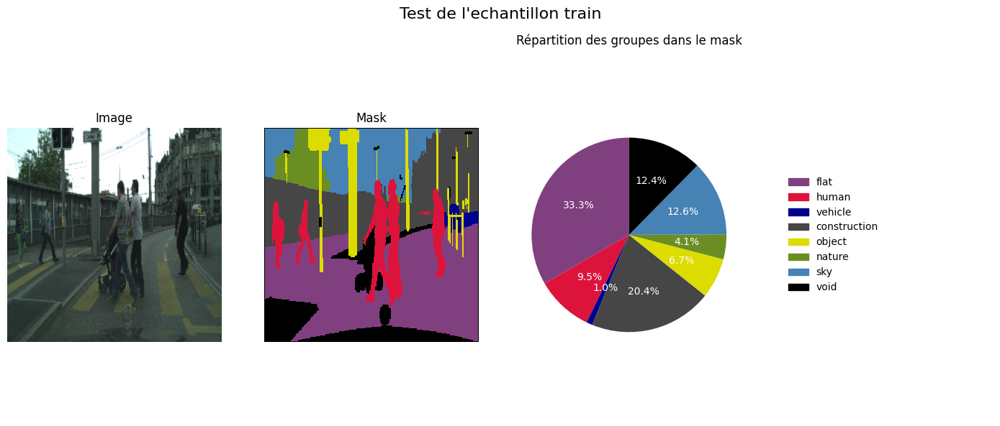

CPU times: user 4.52 s, sys: 194 ms, total: 4.71 s
Wall time: 8.57 s


In [ ]:
%%time
plot_sample(train_ds, title="Test de l'echantillon train")

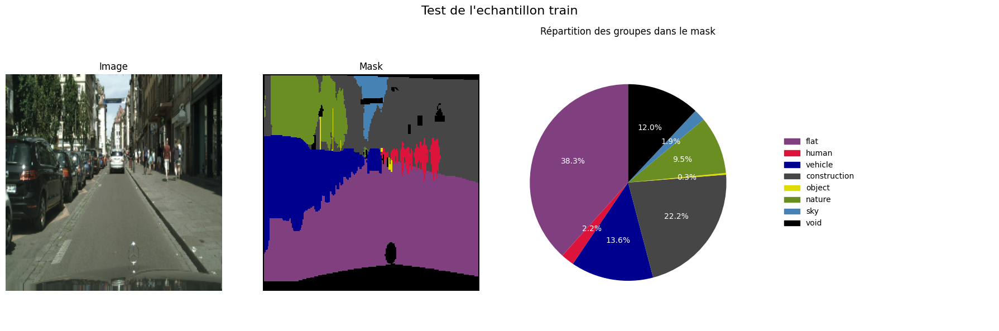

CPU times: user 4.12 s, sys: 107 ms, total: 4.23 s
Wall time: 8.31 s


In [ ]:
%%time
plot_sample(validation_ds, title="Test de l'echantillon validation", figsize=(18, 6))

In [ ]:
def batch_histogram(y):
    if IGNORE_INDEX is not None:
        y = tf.boolean_mask(y, y != IGNORE_INDEX)
    y = tf.cast(tf.reshape(y, [-1]), tf.int32)
    return tf.math.bincount(y, minlength=NUM_CLASSES, maxlength=NUM_CLASSES)

In [ ]:
%%time
IGNORE_INDEX = None
NUM_CLASSES = 8
init = tf.zeros([NUM_CLASSES], dtype=tf.int64)
class_counts = train_ds.map(lambda x,y: batch_histogram(y)) \
                       .reduce(init, lambda a,b: a + tf.cast(b, tf.int64)).numpy()

Cause: could not parse the source code of <function <lambda> at 0x7b196c5e5300>: no matching AST found among candidates:

To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: could not parse the source code of <function <lambda> at 0x7b196c5e5300>: no matching AST found among candidates:

To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: could not parse the source code of <function <lambda> at 0x7b196c5e5260>: no matching AST found among candidates:

To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: could not parse the source code of <function <lambda> at 0x7b196c5e5260>: no matching AST found among candidates:

To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
CPU times: user 3min 14s, sys: 3.37 s, total: 3min 18s
Wall time: 6min 2s


 class_id   class_name   pixels  pct(%)
        0         flat 46247304  38.743
        3 construction 25254116  21.156
        5       nature 18717826  15.681
        7         void 12081867  10.121
        2      vehicle  9090680   7.616
        6          sky  4386346   3.675
        4       object  2148135   1.800
        1        human  1442430   1.208

Total pixels: 119,368,704
Classe majoritaire: flat (38.743%)
Imbalance ratio (max/min non-nul): 32.06


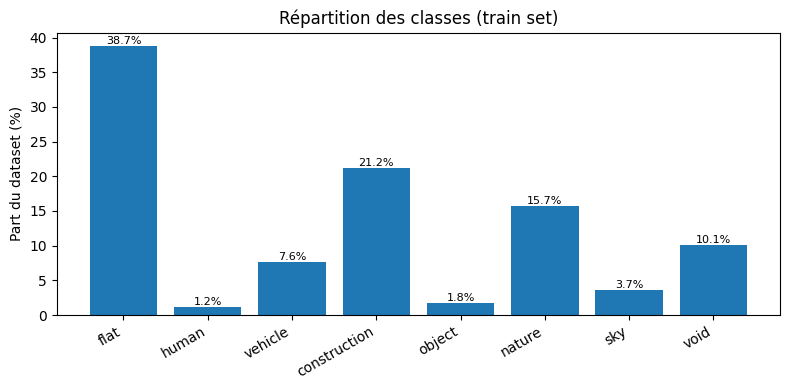

In [ ]:
counts = class_counts
class_names = list(CLASS_GROUPS.keys())
total = counts.sum()
perc = counts / max(total, 1) * 100.0
idx = np.argsort(-perc)
df = pd.DataFrame({
    "class_id": np.arange(len(counts))[idx],
    "class_name": [class_names[i] if i < len(class_names) else str(i) for i in idx],
    "pixels": counts[idx],
    "pct(%)": np.round(perc[idx], 3),
})
print(df.to_string(index=False))

nz = counts[counts>0]
imb_ratio = (nz.max() / nz.min()) if len(nz)>0 else np.nan
print(f"\nTotal pixels: {total:,}")
print(f"Classe majoritaire: {df.iloc[0]['class_name']} ({df.iloc[0]['pct(%)']}%)")
print(f"Imbalance ratio (max/min non-nul): {imb_ratio:.2f}")

plt.figure(figsize=(8,4))
x = np.arange(len(counts))
labels = [class_names[i] if i < len(class_names) else str(i) for i in range(len(counts))]
plt.bar(x, perc)
plt.xticks(x, labels, rotation=30, ha="right")
plt.ylabel("Part du dataset (%)")
plt.title("Répartition des classes (train set)")
for xi, yi in zip(x, perc):
    plt.text(xi, yi, f"{yi:.1f}%", ha="center", va="bottom", fontsize=8)
plt.tight_layout()
plt.show()

In [ ]:
def invfreq_weights(counts, clip=(0.25, 4.0), eps=1e-8):
    counts = counts.astype(np.float64)
    num_classes = len(counts)
    total = counts.sum()
    w = total / (num_classes * (counts + eps))   # ~ 1/freq
    w = w * (num_classes / w.sum())              # moyenne = 1
    if clip:
        w = np.clip(w, clip[0], clip[1])
    return w.astype(np.float32)

w = invfreq_weights(class_counts)
print("Les poids des classes")
print(w)
w = tf.constant(np.asarray(w, dtype=np.float32), tf.float32)

Les poids des classes
[0.25       3.2736535  0.51943487 0.25       2.1981933  0.25227374
 1.076526   0.39083496]


### Augmentation des données

In [ ]:
train_ds_no_aug, _ = make_dataset(data_type="train", batch_size=32, validation_split=0.2, augment=False)
train_ds_aug, _ = make_dataset(data_type="train", batch_size=32, validation_split=0.2, augment=True)

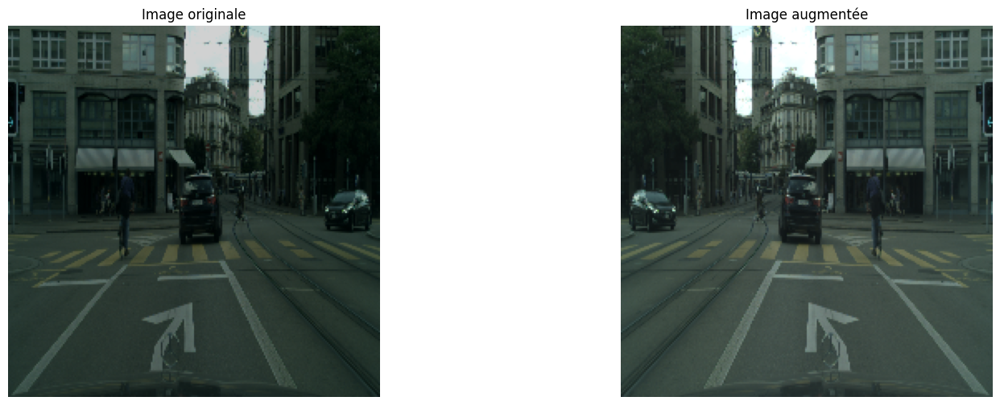

In [ ]:
for (imgs, _), (imgs_aug, _) in zip(train_ds_aug.take(1), train_ds_no_aug.take(1)):
    idx = np.random.choice(range(0,32))
    img = imgs[idx]
    img_aug = imgs_aug[idx]

    plt.figure(figsize=(18, 6))
    ax= plt.subplot(1, 2, 1)
    ax.imshow(img)
    plt.title("Image originale")
    plt.axis("off")

    ax = plt.subplot(1, 2, 2)
    ax.imshow(img_aug)
    plt.title("Image augmentée")
    plt.axis("off")
    plt.show()

# Modélisation

In [ ]:
def add_pixel_weights(x, y):
    # y: (B,H,W,1) ou (B,H,W)
    if y.shape.rank == 4:
        y_ids = tf.squeeze(y, axis=-1)
    else:
        y_ids = y
    y_ids = tf.cast(y_ids, tf.int32)          # (B,H,W)
    wmap  = tf.gather(w, y_ids)               # (B,H,W)
    if IGNORE_INDEX is not None:
        wmap = tf.where(tf.equal(y_ids, IGNORE_INDEX), 0.0, wmap)
    return x, y, wmap

train_ds = train_ds.map(add_pixel_weights).prefetch(tf.data.AUTOTUNE)
validation_ds   = validation_ds.map(add_pixel_weights).prefetch(tf.data.AUTOTUNE)

### Metrics & Loss functions

**Metrcis**:
* MeanIoU
* Accuracy

In [ ]:
class MeanIoUArgmax(tf.keras.metrics.MeanIoU):
    """Custom MeanIoU metric that applies argmax to predictions"""
    def __init__(self, num_classes, name="mean_io_u_argmax", **kwargs):
        super().__init__(num_classes=num_classes, name=name, **kwargs)

    def update_state(self, y_true, y_pred, sample_weight=None):
        # y_pred : (batch, H, W, num_classes) → take the winning class
        y_pred = tf.argmax(y_pred, axis=-1)
        return super().update_state(y_true, y_pred, sample_weight)



**Loss functions:**
* Dice Loss
* Focal Loss
* Combined Loss
* balanced_cross_entropy

In [ ]:
def dice_loss(y_true, y_pred, smooth=1e-6):
    """
    Dice Loss for semantic segmentation

    Args:
        y_true: Ground truth masks (batch_size, H, W)
        y_pred: Predicted logits (batch_size, H, W, num_classes)
        smooth: Smoothing factor to avoid division by zero

    Returns:
        Dice loss value
    """
    # Convert predictions to probabilities
    y_pred = tf.nn.softmax(y_pred, axis=-1)

    # Convert ground truth to one-hot encoding
    num_classes = tf.shape(y_pred)[-1]
    y_true = tf.cast(y_true, tf.int32)
    y_true_one_hot = tf.one_hot(y_true, depth=num_classes)

    # Flatten tensors
    y_true_flat = tf.reshape(y_true_one_hot, [-1, num_classes])
    y_pred_flat = tf.reshape(y_pred, [-1, num_classes])

    # Calculate Dice coefficient for each class
    intersection = tf.reduce_sum(y_true_flat * y_pred_flat, axis=0)
    union = tf.reduce_sum(y_true_flat, axis=0) + tf.reduce_sum(y_pred_flat, axis=0)

    dice_coeff = (2. * intersection + smooth) / (union + smooth)

    # Return 1 - mean Dice coefficient as loss
    return 1 - tf.reduce_mean(dice_coeff)


def focal_loss(y_true, y_pred, alpha=0.25, gamma=2.0):
    """
    Focal Loss for addressing class imbalance

    Args:
        y_true: Ground truth masks (batch_size, H, W)
        y_pred: Predicted logits (batch_size, H, W, num_classes)
        alpha: Weighting factor for rare class
        gamma: Focusing parameter

    Returns:
        Focal loss value
    """
    # Convert to probabilities
    y_pred = tf.nn.softmax(y_pred, axis=-1)

    # Convert ground truth to one-hot encoding
    num_classes = tf.shape(y_pred)[-1]
    y_true = tf.cast(y_true, tf.int32)
    if y_true.shape.rank == 4 and masks.shape[-1] == 1:
      y_true = tf.squeeze(y_true, axis=-1)

    y_true_one_hot = tf.one_hot(y_true, depth=num_classes)

    # Calculate cross entropy
    ce_loss = -y_true_one_hot * tf.math.log(tf.clip_by_value(y_pred, 1e-8, 1.0))

    # Calculate focal weight
    p_t = y_true_one_hot * y_pred
    alpha_t = y_true_one_hot * alpha
    focal_weight = alpha_t * tf.pow(1 - p_t, gamma)

    # Apply focal weight
    focal_loss = focal_weight * ce_loss

    return tf.reduce_mean(tf.reduce_sum(focal_loss, axis=-1))


def combined_loss(y_true, y_pred, dice_weight=0.5, ce_weight=0.5):
    """
    Combined Dice + Cross-Entropy Loss

    Args:
        y_true: Ground truth masks
        y_pred: Predicted logits
        dice_weight: Weight for dice loss
        ce_weight: Weight for cross-entropy loss

    Returns:
        Combined loss value
    """
    dice = dice_loss(y_true, y_pred)
    ce = tf.keras.losses.sparse_categorical_crossentropy(y_true, y_pred, from_logits=False)
    ce = tf.reduce_mean(ce)

    return dice_weight * dice + ce_weight * ce


def balanced_cross_entropy(y_true, y_pred, class_weights=None):
    """
    Balanced Cross-Entropy Loss with class weights

    Args:
        y_true: Ground truth masks
        y_pred: Predicted logits
        class_weights: Optional class weights tensor

    Returns:
        Weighted cross-entropy loss
    """
    if class_weights is None:
        # Default weights for Cityscapes (8 classes)
        class_weights = tf.constant([0.5, 2.0, 2.0, 1.0, 1.5, 3.0, 1.0, 0.1])

    # Convert to probabilities
    y_pred = tf.nn.softmax(y_pred, axis=-1)

    # Convert ground truth to one-hot
    num_classes = tf.shape(y_pred)[-1]
    y_true = tf.cast(y_true, tf.int32)
    if y_true.shape.rank == 4 and masks.shape[-1] == 1:
      y_true = tf.squeeze(y_true, axis=-1)
    y_true_one_hot = tf.one_hot(y_true, depth=num_classes)

    # Calculate weighted cross entropy
    ce_loss = -y_true_one_hot * tf.math.log(tf.clip_by_value(y_pred, 1e-8, 1.0))
    weighted_ce = ce_loss * class_weights

    return tf.reduce_mean(tf.reduce_sum(weighted_ce, axis=-1))

### Architecture

In [ ]:
def conv_block(x, filters, kernel_size=3, activation='relu', batch_norm=True):
    """Basic convolutional block with optional batch normalization"""
    x = layers.Conv2D(filters, kernel_size, padding='same')(x)
    if batch_norm:
        x = layers.BatchNormalization()(x)
    x = layers.Activation(activation)(x)
    return x


def encoder_block(x, filters, pool_size=2):
    """Encoder block for U-Net: conv + conv + maxpool"""
    skip = conv_block(x, filters)
    skip = conv_block(skip, filters)
    x = layers.MaxPooling2D(pool_size)(skip)
    return x, skip


def decoder_block(x, skip, filters):
    """Decoder block for U-Net: upsample + concat + conv + conv"""
    x = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    x = conv_block(x, filters)
    return x

def vgg16_unet(input_shape=(224, 224, 3), num_classes=8, freeze_encoder=True):
    """
    U-Net with VGG16 pretrained backbone

    Args:
        input_shape: Input image shape
        num_classes: Number of segmentation classes
        freeze_encoder: Whether to freeze the encoder weights

    Returns:
        Keras Model
    """
    # Load pretrained VGG16 as encoder
    vgg16 = tf.keras.applications.VGG16(
        input_shape=input_shape,
        weights='imagenet',
        include_top=False
    )

    if freeze_encoder:
        vgg16.trainable = False

    # Extract skip connections from VGG16
    skip1 = vgg16.get_layer('block1_conv2').output    # 224x224, 64
    skip2 = vgg16.get_layer('block2_conv2').output    # 112x112, 128
    skip3 = vgg16.get_layer('block3_conv3').output    # 56x56, 256

    # Bottleneck (center of U-Net)
    bottleneck = vgg16.get_layer('block4_conv3').output  # 28x28, 512
    x = conv_block(bottleneck, 1024)
    x = conv_block(x, 1024)

    # Decoder with skip connections
    # Upsample and concatenate with skip3
    x = layers.Conv2DTranspose(256, 2, strides=2, padding='same')(x)  # 56x56
    x = layers.Concatenate()([x, skip3])
    x = conv_block(x, 256)
    x = conv_block(x, 256)

    # Upsample and concatenate with skip2
    x = layers.Conv2DTranspose(128, 2, strides=2, padding='same')(x)  # 112x112
    x = layers.Concatenate()([x, skip2])
    x = conv_block(x, 128)
    x = conv_block(x, 128)

    # Upsample and concatenate with skip1
    x = layers.Conv2DTranspose(64, 2, strides=2, padding='same')(x)   # 224x224
    x = layers.Concatenate()([x, skip1])
    x = conv_block(x, 64)
    x = conv_block(x, 64)

    # Final classification layer
    outputs = layers.Conv2D(num_classes, 1, activation='softmax', name='segmentation_output')(x)

    model = Model(vgg16.input, outputs, name='VGG16_UNet')
    return model

def build_mit_pyramid_extractor(preset="mit_b0_ade20k_512", load_weights=True):
    """
    Expose les 4 features pyramidales (output_level_0..3) du backbone MiT.
    L'input du modèle retourné correspond à celui du preset (ex. 512x512).
    """
    mit = MiTBackbone.from_preset(preset, load_weights=load_weights)
    names = [f"output_level_{i}" for i in range(4)]
    feats = [mit.get_layer(n).output for n in names]   # 1/4, 1/8, 1/16, 1/32
    return Model(mit.input, feats, name="mit_pyramid_extractor")

def segformer_decoder(features, num_classes, decoder_dim=256, depth=0, name="segformer_decoder"):
    f1, f2, f3, f4 = features  # 1/4, 1/8, 1/16, 1/32

    def proj(x):
        x = layers.Conv2D(decoder_dim, 3, padding="same", use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        return layers.Activation("relu")(x)

    p1, p2, p3, p4 = proj(f1), proj(f2), proj(f3), proj(f4)
    p2u = layers.UpSampling2D(2, interpolation="bilinear")(p2)
    p3u = layers.UpSampling2D(4, interpolation="bilinear")(p3)
    p4u = layers.UpSampling2D(8, interpolation="bilinear")(p4)

    x = layers.Concatenate()([p1, p2u, p3u, p4u])
    for _ in range(depth):
        x = layers.Conv2D(decoder_dim, 3, padding="same", use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)

    logits_1_4 = layers.Conv2D(num_classes, 1, padding="same", name=f"{name}_logits_1_4")(x)
    return logits_1_4

def segformer_keras(input_shape=(224, 224, 3), num_classes=8,
                    pretraining='imagenet',                  # 'imagenet' ou 'none'
                    mit_preset='mit_b0_ade20k_512',          # ou 'mit_b2_ade20k_512' pour plus gros
                    decoder_dim=256, decoder_depth=0,
                    freeze_encoder=True,
                    name="SegFormer"):
    load_w = (pretraining == 'imagenet')

    # 1) Extracteur pyramidal (preset, ex. 512x512)
    mit_feats = build_mit_pyramid_extractor(preset=mit_preset, load_weights=load_w)
    if freeze_encoder:
        mit_feats.trainable = False   # gèle tout le backbone (patch+stages+LN)

    Hm, Wm = mit_feats.input_shape[1:3]   # ex. (512, 512)

    # 2) Entrée utilisateur 224² → resize vers taille attendue par MiT
    inputs = layers.Input(shape=input_shape)
    x_in   = layers.Resizing(Hm, Wm, interpolation="bilinear", name="resize_to_mit")(inputs)

    f1, f2, f3, f4 = mit_feats(x_in)      # 1/4..1/32 (sur base Hm×Wm)

    # 3) Décodeur MLP → logits à 1/4 (Hm/4 × Wm/4), puis upsample à Hm×Wm
    logits_1_4   = segformer_decoder([f1, f2, f3, f4], num_classes=num_classes,
                                     decoder_dim=decoder_dim, depth=decoder_depth)
    logits_full  = layers.UpSampling2D(4, interpolation="bilinear", name="upsample_to_mit")(logits_1_4)

    # 4) Revenir à 224² et softmax
    logits_224   = layers.Resizing(input_shape[0], input_shape[1], interpolation="bilinear",
                                   name="resize_to_input")(logits_full)
    outputs      = layers.Activation("softmax", name="segmentation_output")(logits_224)
    return Model(inputs, outputs, name=name)


def create_model(model_type='vgg16_unet', input_shape=(224, 224, 3), num_classes=8, **kwargs):
    """
    Factory function to create different model architectures

    Args:
        model_type: Type of model ('unet_mini', 'vgg16_unet', 'resnet50_unet')
        input_shape: Input image shape
        num_classes: Number of segmentation classes
        **kwargs: Additional model-specific arguments

    Returns:
        Keras Model
    """
    if model_type == 'vgg16_unet':
        return vgg16_unet(input_shape, num_classes, **kwargs)
    elif model_type == 'segformer':
        return segformer_keras(input_shape=input_shape, num_classes=num_classes, **kwargs)
    else:
        raise ValueError(f"Unknown model type: {model_type}")

def get_loss_function(loss_type='cross_entropy'):
    """
    Get loss function by name

    Args:
        loss_type: Type of loss function

    Returns:
        Loss function
    """
    if loss_type == 'cross_entropy':
        return 'sparse_categorical_crossentropy'
    elif loss_type == 'dice_loss':
        return dice_loss
    elif loss_type == 'focal_loss':
        return focal_loss
    elif loss_type == 'combined_loss':
        return combined_loss
    elif loss_type == 'balanced_cross_entropy':
        return balanced_cross_entropy
    else:
        raise ValueError(f"Unknown loss type: {loss_type}")


def compile_model(model, loss_type='cross_entropy', learning_rate=1e-4, metrics=None):
    """
    Compile model with specified loss and metrics

    Args:
        model: Keras model to compile
        loss_type: Type of loss function
        learning_rate: Learning rate for optimizer
        metrics: List of metrics to track

    Returns:
        Compiled model
    """
    if metrics is None:
        metrics = [MeanIoUArgmax(num_classes=8), 'accuracy']

    loss_fn = get_loss_function(loss_type)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss=loss_fn,
        metrics=metrics
    )

    return model

In [ ]:
import math
def plot_training_history(history, metrics_to_plot=None, ncols=2, figsize_per_plot=(5, 4), title="Metrics d'entrainement et de validation"):
    """
    Affiche les courbes d'entraînement et de validation dans une grille de subplots.

    Args:
        history: l'objet History retourné par model.fit()
        metrics_to_plot: liste des noms de métriques (sans 'val_') à tracer. Si None, déduit automatiquement.
        ncols: nombre de colonnes dans la grille
        figsize_per_plot: taille de chaque subplot (largeur, hauteur)
    """
    history_dict = history.history
    all_metrics = set([k.replace("val_", "") for k in history_dict if not k.startswith("val_")])
    metrics = metrics_to_plot if metrics_to_plot else sorted(all_metrics)

    n_plots = len(metrics)
    nrows = math.ceil(n_plots / ncols)
    figsize = (figsize_per_plot[0] * ncols, figsize_per_plot[1] * nrows)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    axes = axes.flatten()

    for idx, metric in enumerate(metrics):
        ax = axes[idx]
        ax.plot(history_dict.get(metric, []), label=f"train_{metric}")
        val_key = f"val_{metric}"
        if val_key in history_dict:
            ax.plot(history_dict[val_key], label=f"val_{metric}")
        #ax.set_title(metric)
        ax.set_xlabel("Epoch")
        ax.set_ylabel(metric)
        ax.legend()
        ax.grid(True)

    # Supprimer les axes inutilisés (si nrows * ncols > n_plots)
    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(title)
    plt.show()

### Data samples

In [ ]:
%%time
train_sample = train_ds.take(int(0.4*len(train_ds)))
validation_sample = validation_ds.take(int(0.8*len(validation_ds)))

CPU times: user 3.52 ms, sys: 1.02 ms, total: 4.53 ms
Wall time: 3.89 ms


In [ ]:
cb = [
  #tf.keras.callbacks.ModelCheckpoint(f"best_model_mini_unet.h5", save_best_only=True),
  tf.keras.callbacks.ReduceLROnPlateau(patience=3),
  tf.keras.callbacks.EarlyStopping(patience=10)
]

## Baseline: VGG16-UNet

In [ ]:
base_model = create_model(model_type='vgg16_unet')
base_model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "VGG16_UNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 224, 224,  │      1,792 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 224, 224,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 112, 112,  │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 112, 112,  │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 112, 112,  │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 56, 56,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 56, 56,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 56, 56,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 56, 56,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 28, 28,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 28, 28,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 28, 28,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 28, 28,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 28, 28,    │  4,719,616 │ block4_conv3[0][… │
│                     │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 28, 28,    │      4,096 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 1024)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 28, 28,    │          0 │ batch_normalizat

 Total params: 25,341,576 (96.67 MB)

 Trainable params: 17,700,424 (67.52 MB)

 Non-trainable params: 7,641,152 (29.15 MB)

In [ ]:
%%time
base_model = compile_model(base_model)
epochs = 30
hist_base_model = base_model.fit(
    train_sample,
    validation_data=validation_sample,
    epochs=epochs,
    callbacks=cb
)

Epoch 1/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.2371 - loss: 0.8291 - mean_io_u_argmax: 0.1010 - val_accuracy: 0.0360 - val_loss: 1.9284 - val_mean_io_u_argmax: 0.0080 - learning_rate: 1.0000e-04
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 22s 723ms/step - accuracy: 0.5030 - loss: 0.5318 - mean_io_u_argmax: 0.2601 - val_accuracy: 0.1458 - val_loss: 1.3635 - val_mean_io_u_argmax: 0.0674 - learning_rate: 1.0000e-04
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 24s 774ms/step - accuracy: 0.6927 - loss: 0.4128 - mean_io_u_argmax: 0.4186 - val_accuracy: 0.2259 - val_loss: 0.8808 - val_mean_io_u_argmax: 0.1458 - learning_rate: 1.0000e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 22s 714ms/step - accuracy: 0.7509 - loss: 0.3464 - mean_io_u_argmax: 0.4826 - val_accuracy: 0.3723 - val_loss: 0.6304 - val_mean_io_u_argmax: 0.2158 - learning_rate: 1.0000e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 22s 716ms/step - accuracy: 0.7780 - loss: 0.3118 - mean_io_u_argmax: 0.5166 - val_accuracy: 0.6596 - val

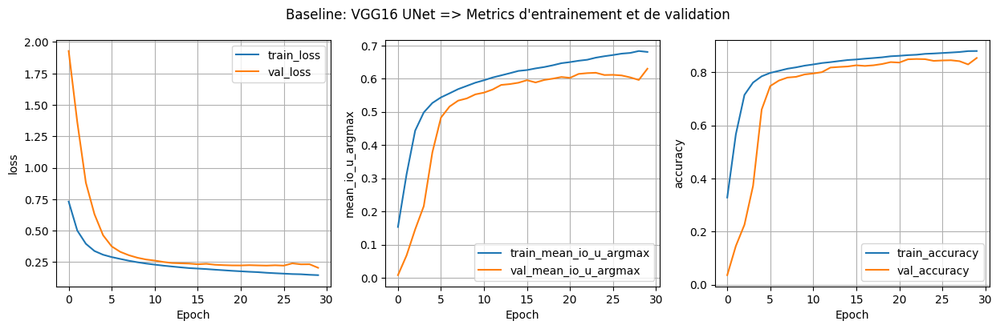

In [ ]:
plot_training_history(history=hist_base_model, metrics_to_plot=['loss', 'mean_io_u_argmax', 'accuracy'], ncols=3, title="Baseline: VGG16 UNet => Metrics d'entrainement et de validation")

* **Train vs Val Loss**

  * La *train\_loss* décroît régulièrement de \~0.75 → \~0.20 et se tasse vers les époques 15–20.
  * La *val\_loss* chute vite au début (≈ époque 5), puis oscille autour de **0.23–0.25** avec un petit rebond en fin d’entraînement.
  * L’écart train/val reste faible mais s’ouvre légèrement en fin → **début d’overfit**.

* **Mean IoU**

  * *train\_mIoU* monte de façon quasi monotone jusqu’à **\~0.68–0.70**.
  * *val\_mIoU* suit la tendance, plus bas, et se stabilise vers **\~0.60–0.62** (progression lisse, saturation en fin).

* **Accuracy**

  * *train\_accuracy* grimpe rapidement et atteint **\~0.87**.
  * *val\_accuracy* se stabilise autour de **\~0.84–0.86** avec une progression régulière.

**Bilan**
Apprentissage stable et propre, **généralisation correcte** mais avec un **léger overfitting en fin d’entraînement** (val\_loss qui remonte, petit gap constant en IoU/accuracy).

### Evaluation

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


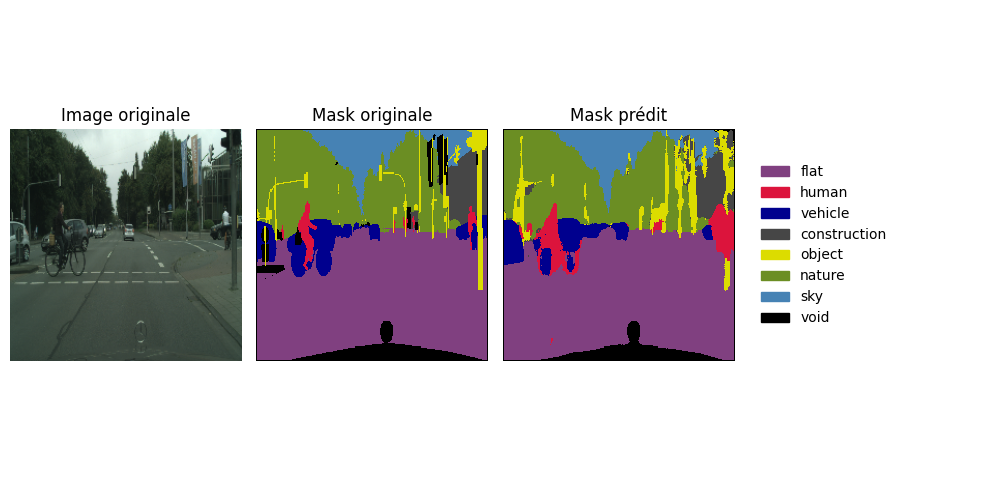

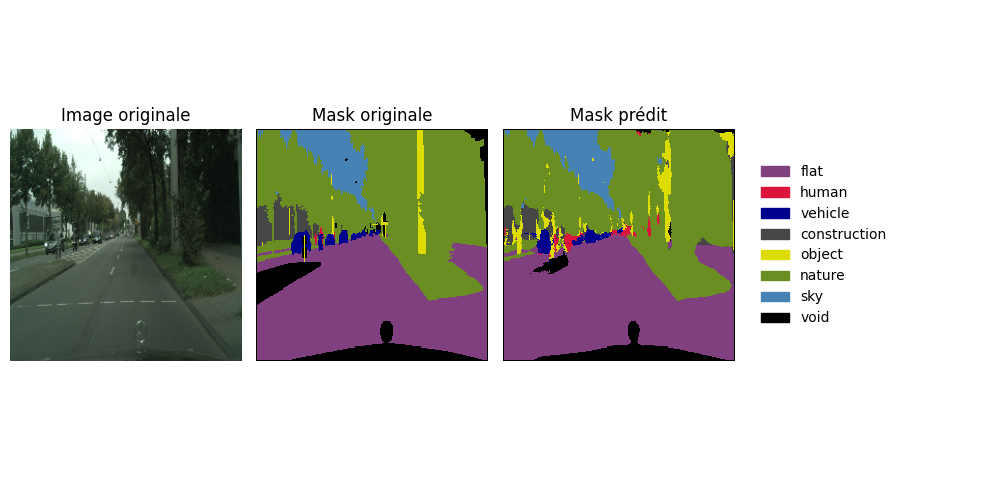

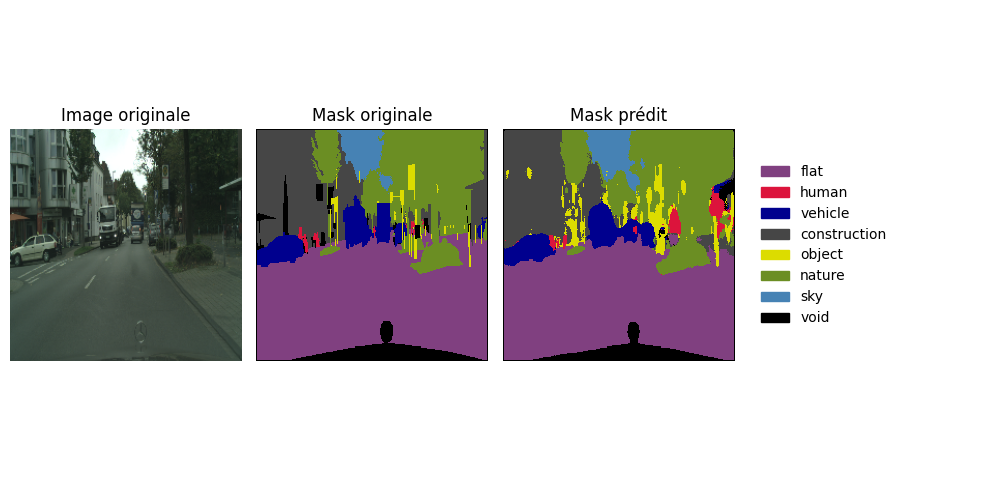

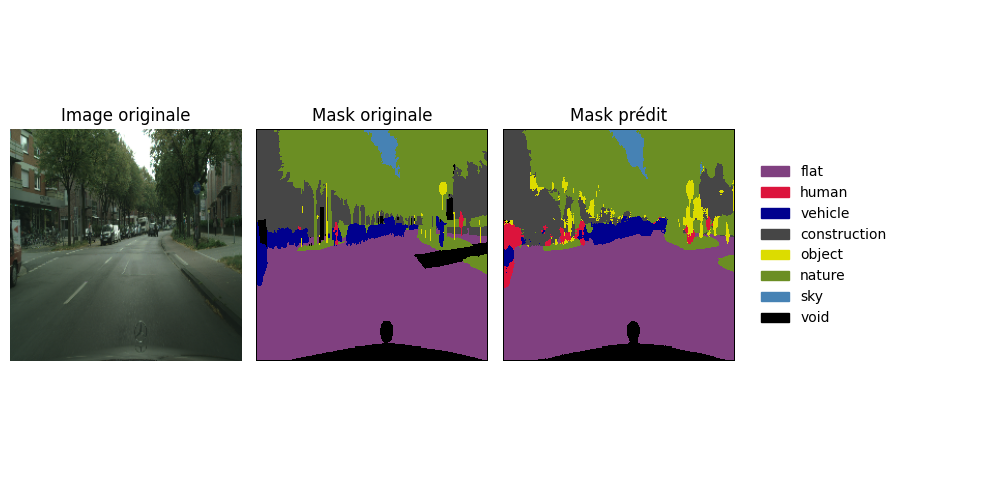

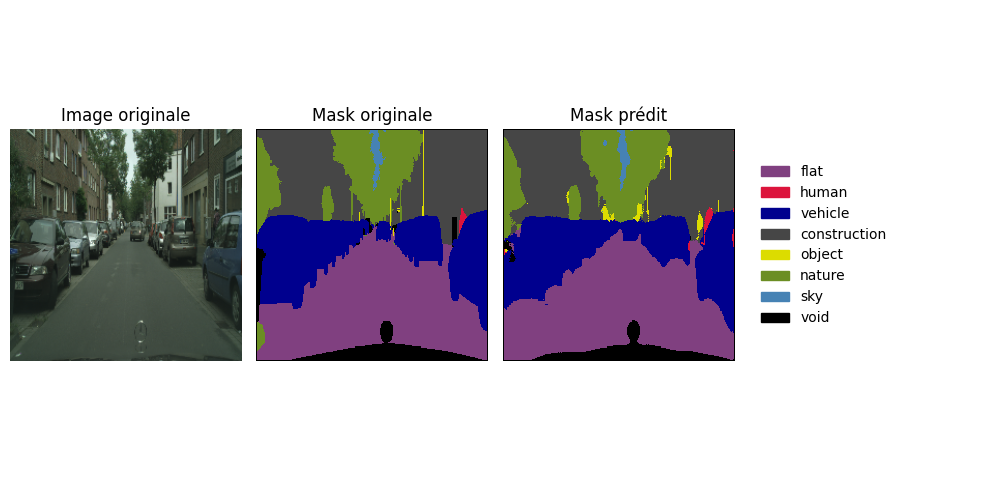

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step


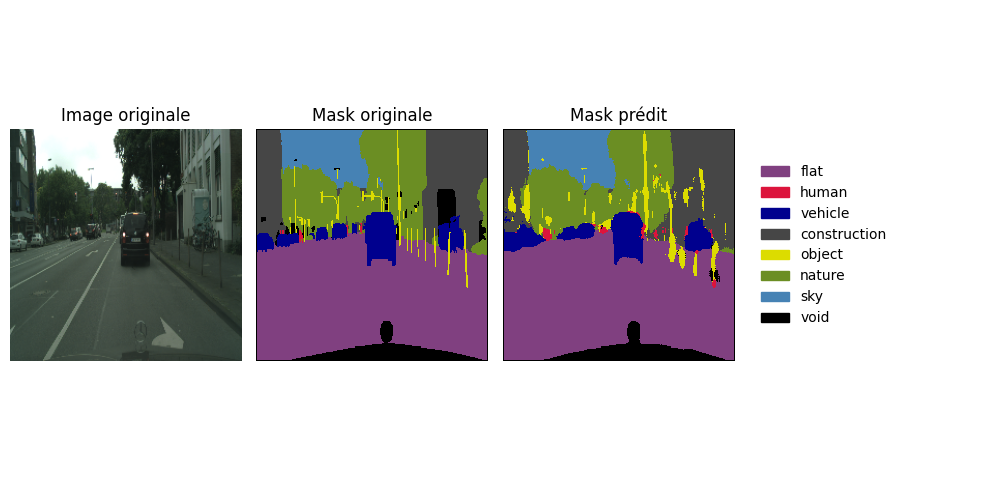

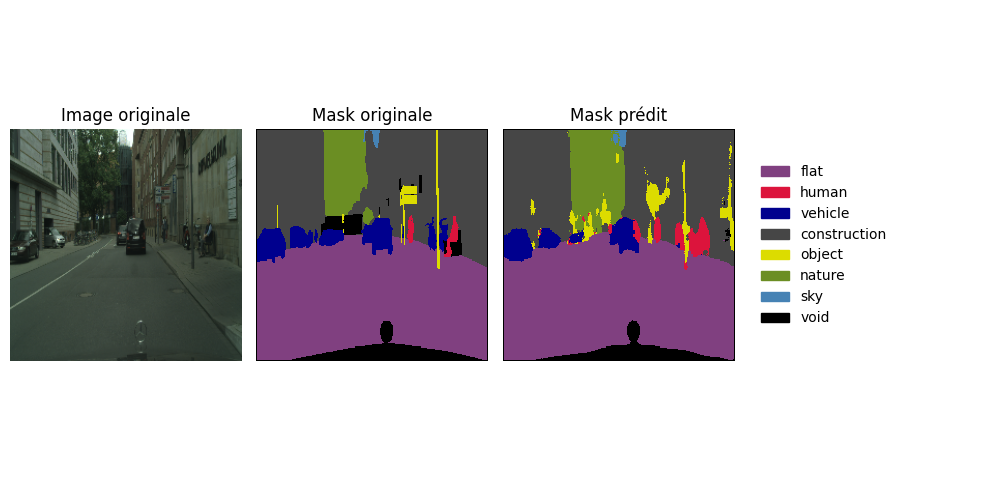

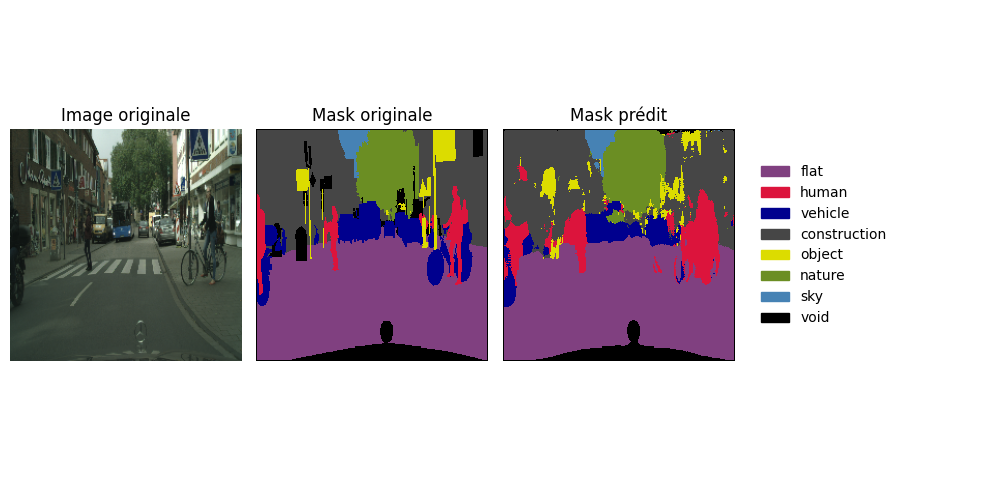

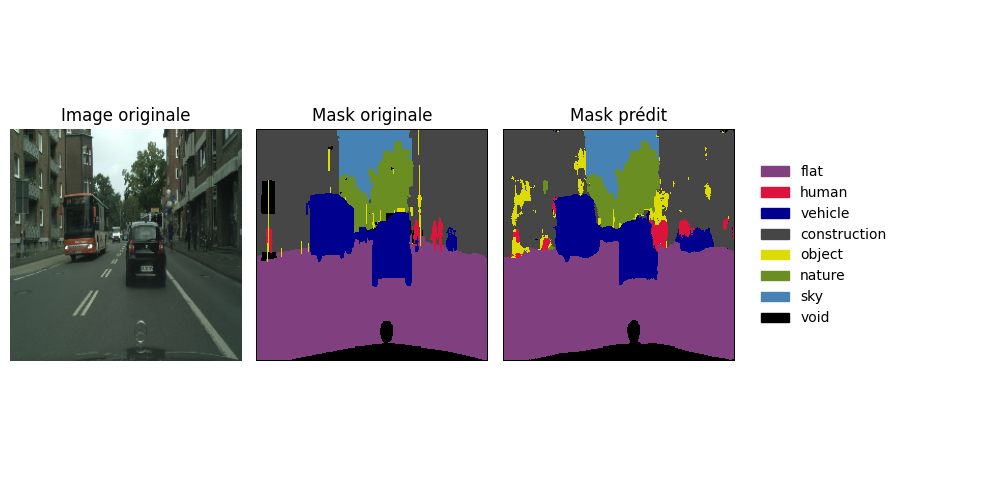

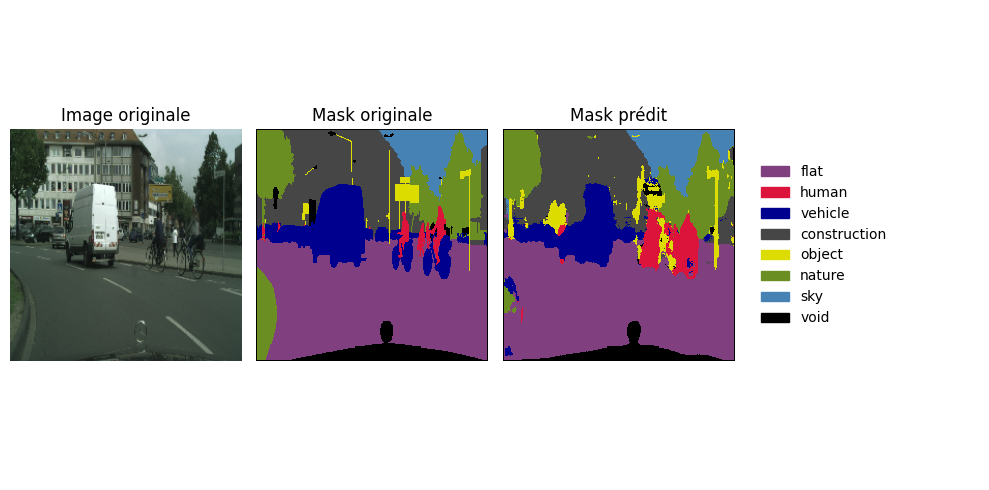

In [ ]:
for batch, masks in test_ds.take(2):  # prendre un seul batch (32 images)
    preds = base_model.predict(batch)  # prédictions sur les 32 images
    pred_masks = np.argmax(preds, axis=-1)  # (32, H, W)
    batch_np = batch.numpy()  # convertir les images pour affichage
    masks_np = masks.numpy()  # convertir les images pour affichage

    for i in range(5):  # afficher les 5 premières
        display_prediction(batch_np[i], masks_np[i], pred_masks[i])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step
y_true shape: (25088000,) y_pred shape: (25088000,)


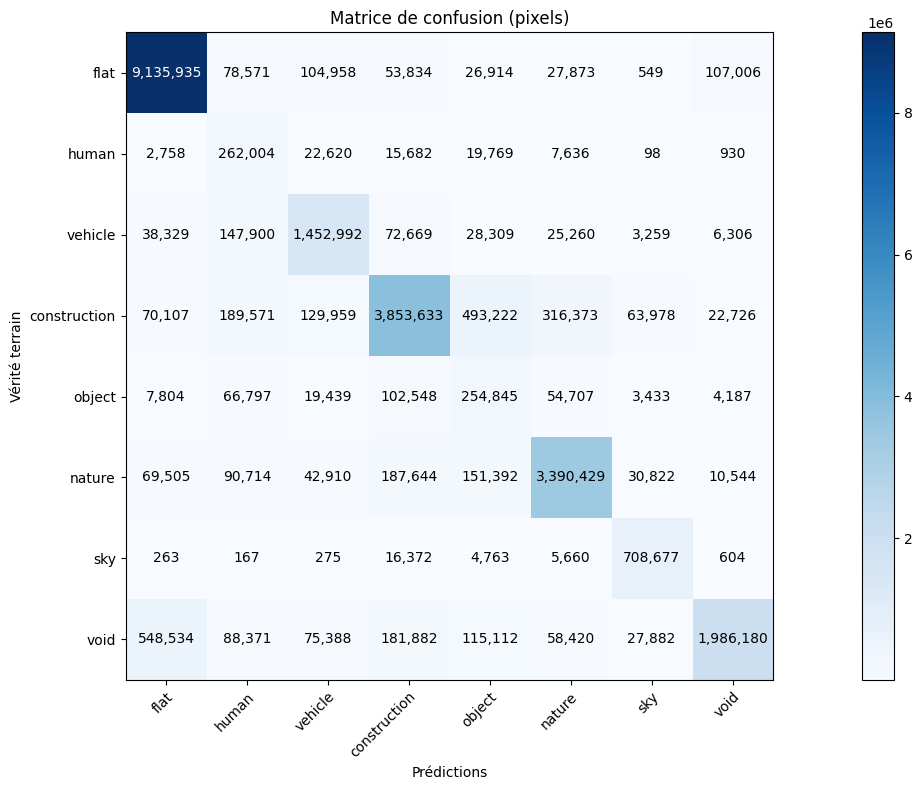

In [ ]:
df_summary_base = plot_confusion_matrix(base_model, test_ds)

In [ ]:
df_summary_base.sort_values(by="Accuracy (%)", ascending=False, inplace=True)
df_summary_base.reset_index(drop=True, inplace=True)
display(df_summary_base)

,Group,Total Pixels,Correct Pixels,Accuracy (%)
0,sky,736781,708677,96.185569
1,flat,9535640,9135935,95.808304
2,nature,3973960,3390429,85.316133
3,vehicle,1775024,1452992,81.857597
4,human,331497,262004,79.036613
5,construction,5139569,3853633,74.979692
6,void,3081769,1986180,64.449347
7,object,513760,254845,49.603901


## Segformer Model

In [ ]:
%%time
seg_model = create_model(
    model_type='segformer',
    mit_preset='mit_b2_cityscapes_1024',
    decoder_dim=256,
    decoder_depth=2,
    name="SegFormer_B2x512d2"
    )
seg_model.summary()

100%|██████████| 978/978 [00:00<00:00, 1.97MB/s]


Model: "SegFormer_B2x512d2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resize_to_mit       │ (None, 224, 224,  │          0 │ input_layer_2[0]… │
│ (Resizing)          │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mit_pyramid_extrac… │ [(None, 56, 56,   │ 24,196,288 │ resize_to_mit[0]… │
│ (Functional)        │ 64), (None, 28,   │            │                   │
│                     │ 28, 128), (None,  │            │                   │
│                     │ 14, 14, 320),     │            │                   │
│                     │ (None, 7, 7,      │            │                   │
│                     │ 512)]             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_26 (Conv2D)  │ (None, 28, 28,    │    294,912 │ mit_pyramid_extr… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_27 (Conv2D)  │ (None, 14, 14,    │    737,280 │ mit_pyramid_extr… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_28 (Conv2D)  │ (None, 7, 7, 256) │  1,179,648 │ mit_pyramid_extr… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_25 (Conv2D)  │ (None, 56, 56,    │    147,456 │ mit_pyramid_extr… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 28, 28,    │      1,024 │ conv2d_26[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 14, 14,    │      1,024 │ conv2d_27[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 7, 7, 256) │      1,024 │ conv2d_28[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │      1,024 │ conv2d_25[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_9        │ (None, 28, 28,    │          0 │ batch_normalizat… │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_10       │ (None, 14, 14,    │          0 │ batch_normalizat… │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_11       │ (None, 7, 7, 256) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_8        │ (None, 56, 56,    │          0 │ batch_normalizat… │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 56, 56,    │          0 │ activation_9[0][

 Total params: 29,512,904 (112.58 MB)

 Trainable params: 5,313,544 (20.27 MB)

 Non-trainable params: 24,199,360 (92.31 MB)

CPU times: user 5.91 s, sys: 290 ms, total: 6.2 s
Wall time: 20.6 s


In [ ]:
%%time
seg_model = compile_model(seg_model)
epochs = 30
hist_seg_model = seg_model.fit(
    train_sample,
    validation_data=validation_sample,
    epochs=epochs,
    callbacks=cb
)

Epoch 1/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 166s 1s/step - accuracy: 0.6156 - loss: 0.4696 - mean_io_u_argmax: 0.3568 - val_accuracy: 0.7875 - val_loss: 0.3745 - val_mean_io_u_argmax: 0.5316 - learning_rate: 1.0000e-04
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 18s 607ms/step - accuracy: 0.7989 - loss: 0.2463 - mean_io_u_argmax: 0.5457 - val_accuracy: 0.7967 - val_loss: 0.3109 - val_mean_io_u_argmax: 0.5579 - learning_rate: 1.0000e-04
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 19s 616ms/step - accuracy: 0.8150 - loss: 0.2190 - mean_io_u_argmax: 0.5718 - val_accuracy: 0.8040 - val_loss: 0.2669 - val_mean_io_u_argmax: 0.5749 - learning_rate: 1.0000e-04
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 19s 614ms/step - accuracy: 0.8234 - loss: 0.2054 - mean_io_u_argmax: 0.5841 - val_accuracy: 0.8128 - val_loss: 0.2350 - val_mean_io_u_argmax: 0.5846 - learning_rate: 1.0000e-04
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 19s 619ms/step - accuracy: 0.8277 - loss: 0.1971 - mean_io_u_argmax: 0.5919 - val_accuracy: 0.8164 - val

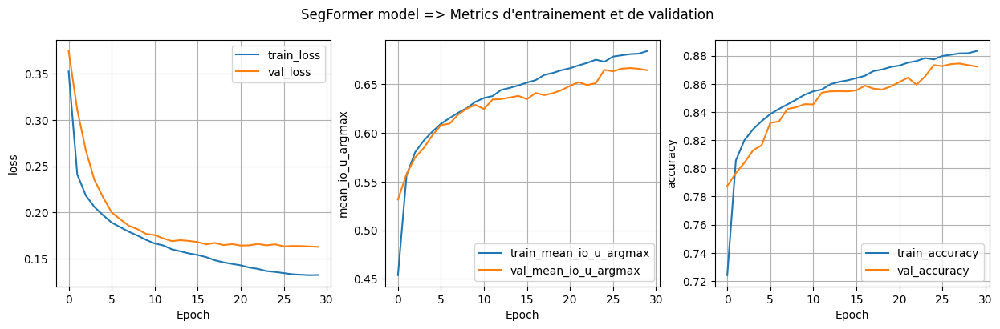

In [ ]:
plot_training_history(history=hist_seg_model, metrics_to_plot=['loss', 'mean_io_u_argmax', 'accuracy'], ncols=3, title="SegFormer model => Metrics d'entrainement et de validation")

* **Train vs Val Loss**

  * *train\_loss* descend vite (\~0.35 → **\~0.13**) et continue à baisser jusqu’à la fin.
  * *val\_loss* chute aussi rapidement puis **se stabilise vers \~0.16–0.17** à partir de l’époque \~10, avec un léger plateau/rebond.
  * Petit écart train/val en fin → **overfit très modéré** et bien contrôlé.

* **Mean IoU**

  * *train mIoU* progresse quasi linéairement jusqu’à **\~0.68–0.69**.
  * *val mIoU* suit de près, **\~0.65–0.66** en fin, montée lisse avec peu de fluctuations.

* **Accuracy**

  * *train\_accuracy* monte de \~0.72 à **\~0.88–0.89**.
  * *val\_accuracy* atteint **\~0.87–0.88**, trajectoire stable (petit creux local puis reprise).

**Bilan**:

Convergence rapide et **généralisation solide**. Par rapport au VGG16-UNet, la validation est **meilleure et plus stable** (mIoU val \~0.65–0.66 vs \~0.60–0.62; accuracy val \~0.87–0.88 vs \~0.84–0.86).


### Evaluation

1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step


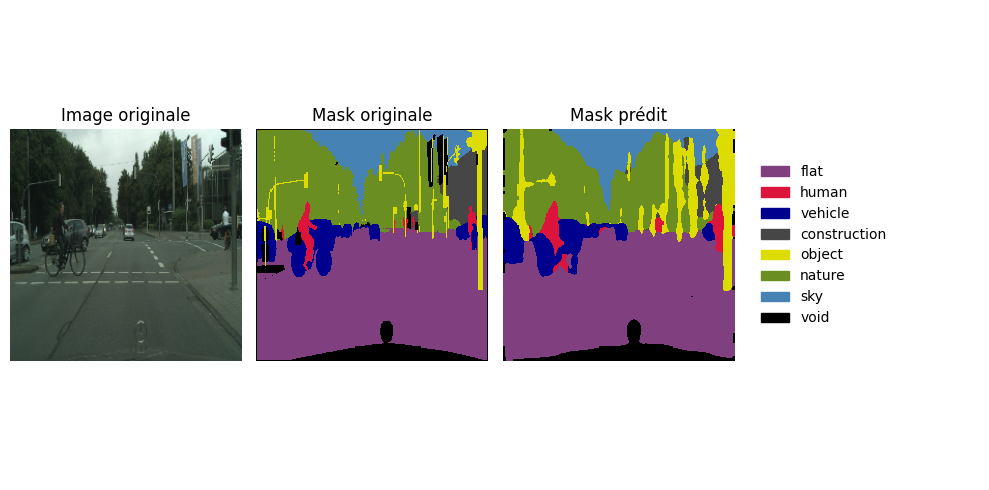

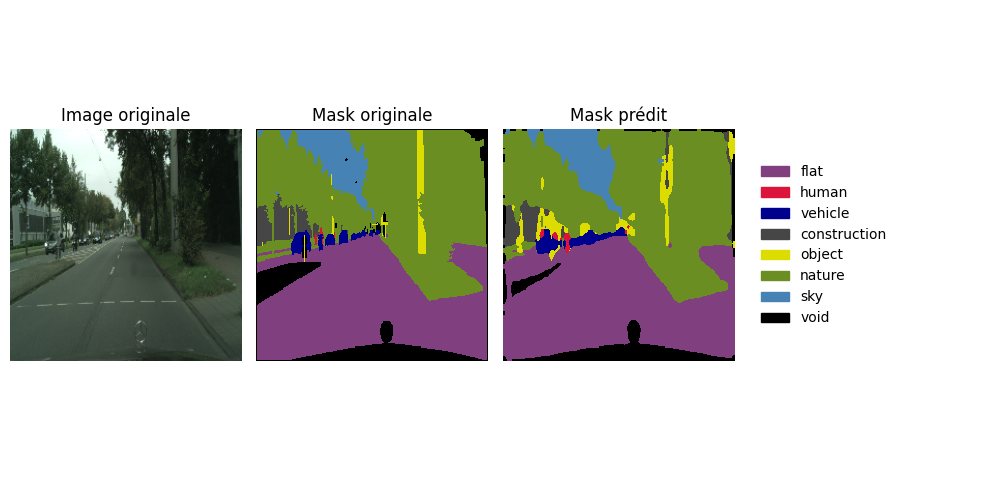

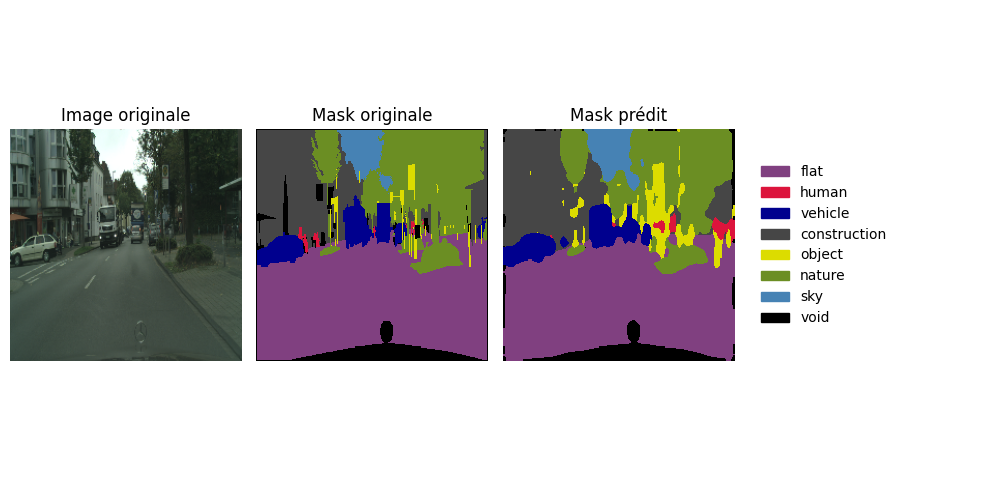

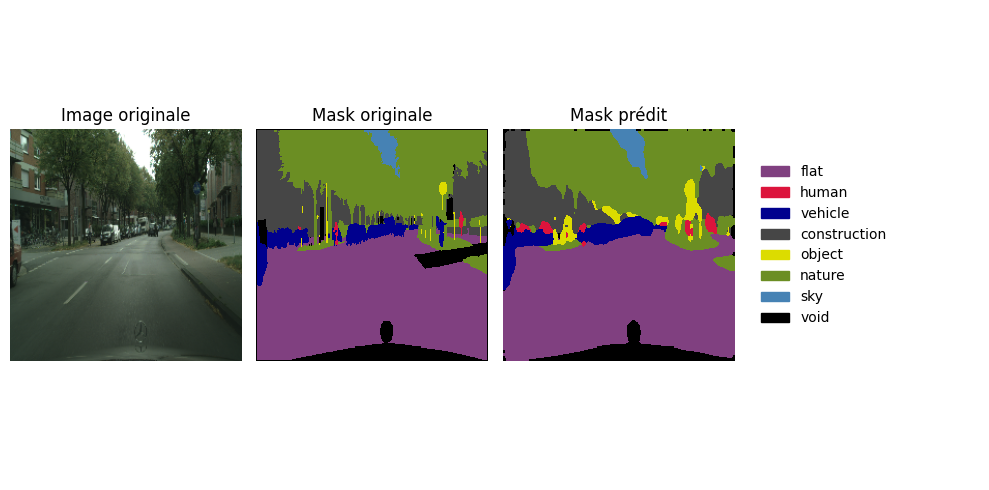

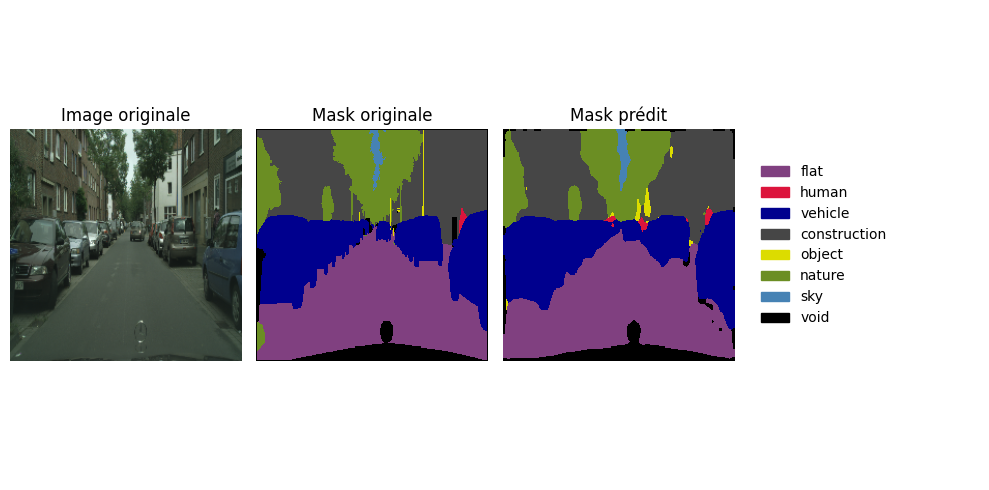

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


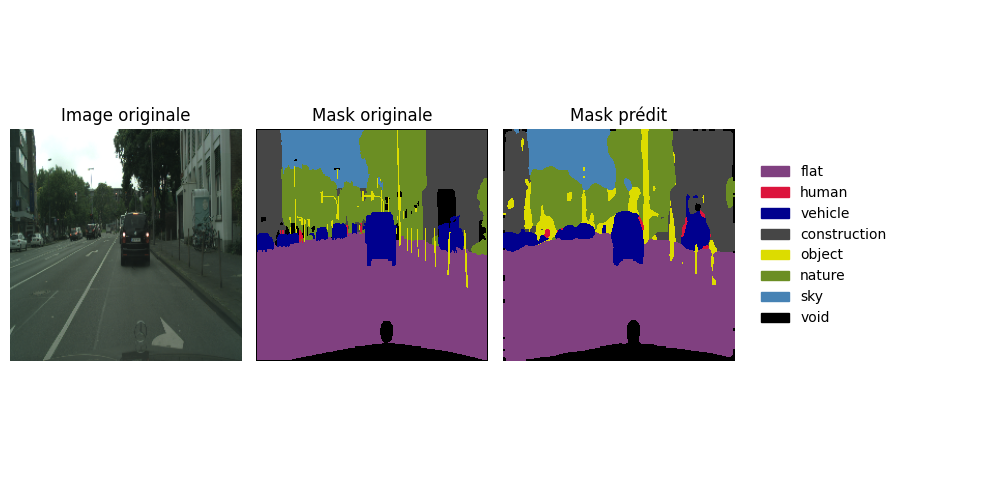

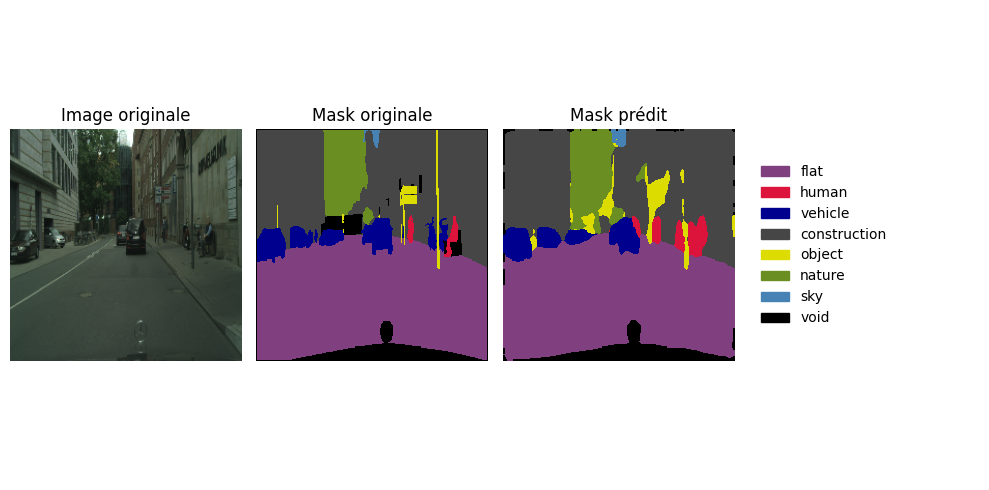

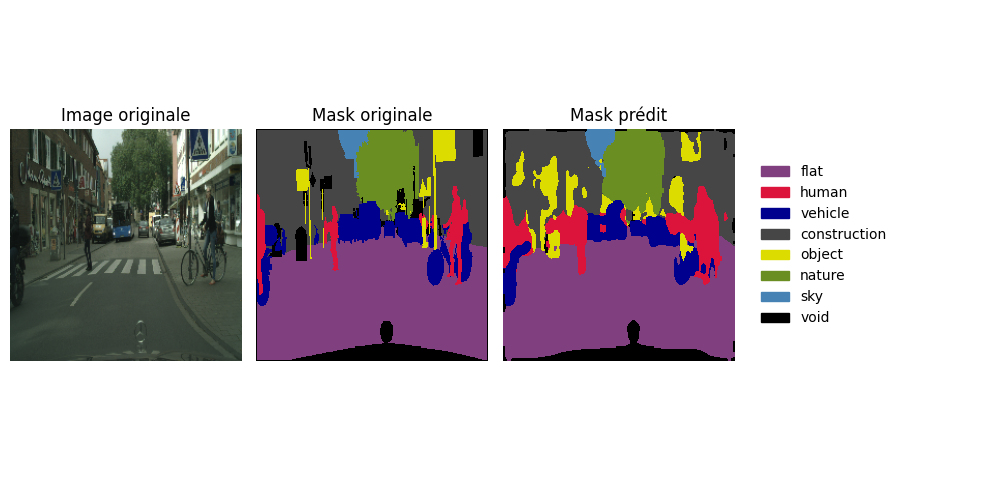

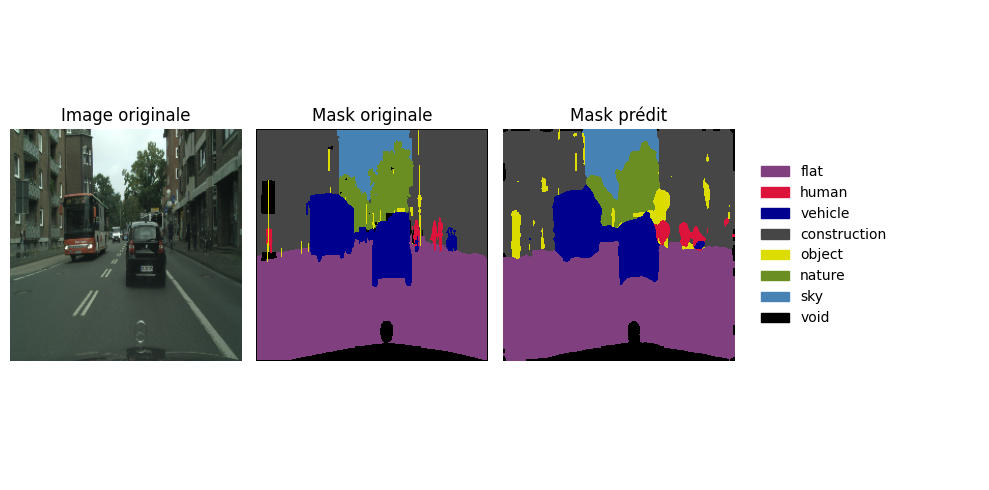

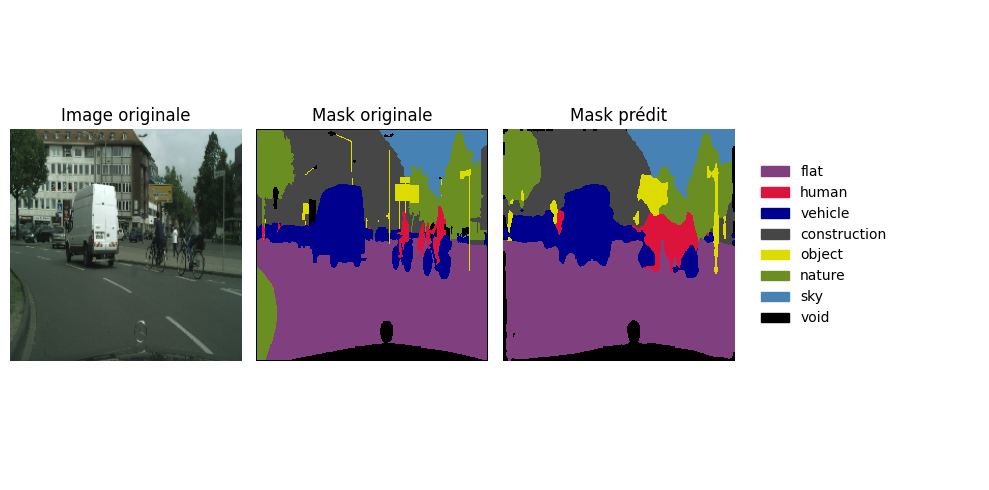

In [ ]:
for batch, masks in test_ds.take(2):  # prendre un seul batch (32 images)
    preds = seg_model.predict(batch)  # prédictions sur les 32 images
    pred_masks = np.argmax(preds, axis=-1)  # (32, H, W)
    batch_np = batch.numpy()  # convertir les images pour affichage
    masks_np = masks.numpy()  # convertir les images pour affichage

    for i in range(5):  # afficher les 5 premières
        display_prediction(batch_np[i], masks_np[i], pred_masks[i])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 59s 59s/step
y_true shape: (25088000,) y_pred shape: (25088000,)


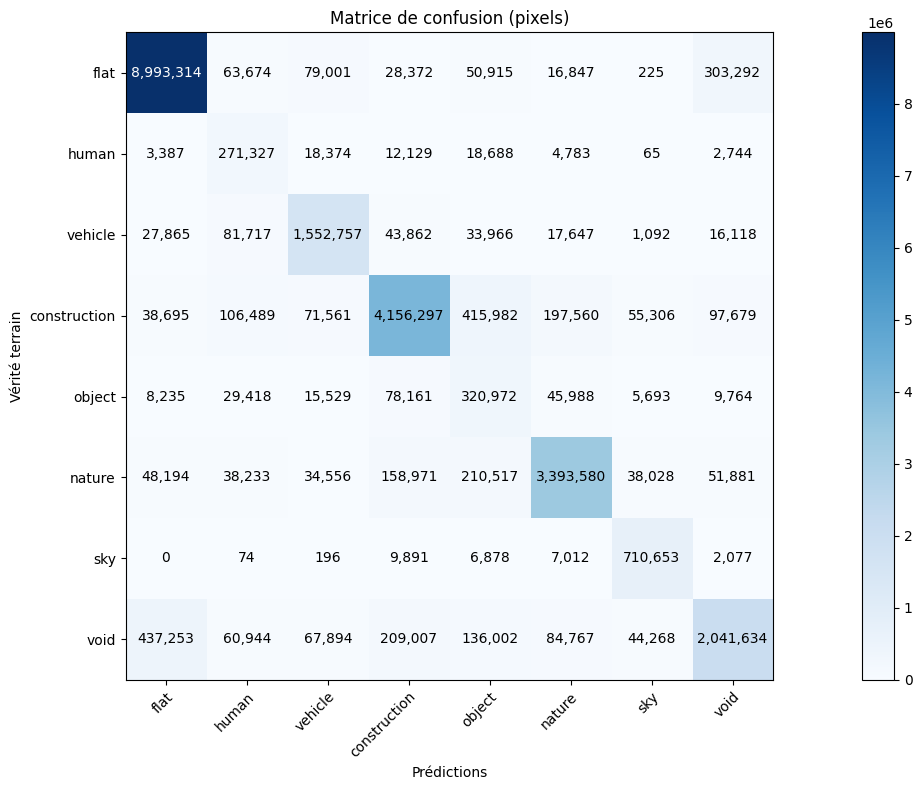

In [ ]:
df_summary = plot_confusion_matrix(seg_model, test_ds)

In [ ]:
df_summary.sort_values(by="Accuracy (%)", ascending=False, inplace=True)
df_summary.reset_index(drop=True, inplace=True)
display(df_summary)

,Group,Total Pixels,Correct Pixels,Accuracy (%)
0,sky,736781,710653,96.453763
1,flat,9535640,8993314,94.312642
2,vehicle,1775024,1552757,87.478085
3,nature,3973960,3393580,85.395424
4,human,331497,271327,81.849006
5,construction,5139569,4156297,80.868590
6,void,3081769,2041634,66.248768
7,object,513760,320972,62.475086


# Comparaison des modéls

## Performance

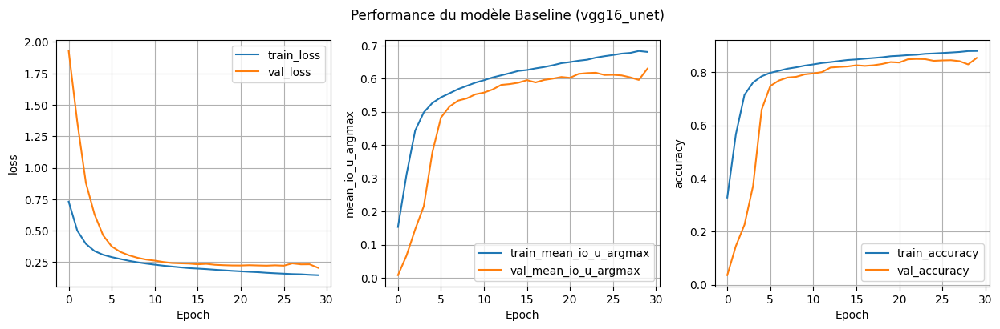

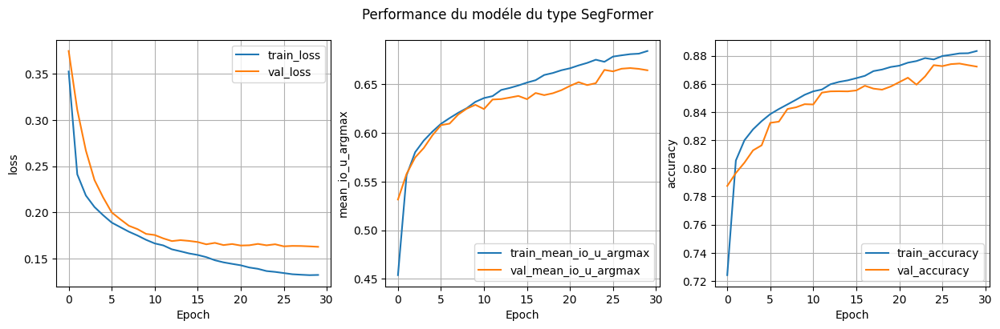

In [ ]:
plot_training_history(history=hist_base_model, metrics_to_plot=['loss', 'mean_io_u_argmax', 'accuracy'], ncols=3, title="Performance du modèle Baseline (vgg16_unet)")
plot_training_history(history=hist_seg_model, metrics_to_plot=['loss', 'mean_io_u_argmax', 'accuracy'], ncols=3, title="Performance du modéle du type SegFormer")

In [ ]:
def plot_grouped_bars(df, metric, title, ax):
    # Ensure consistent order of groups
    groups = sorted(df["Group"].unique(), key=lambda g: g)
    models = ["VGG16-U-Net", "Mit-SegFormer"]
    n_groups = len(groups)
    n_models = len(models)

    # Bar settings
    bar_width = 0.35
    x = range(n_groups)

    for i, model in enumerate(models):
        values = []
        for g in groups:
            val = df[(df["Group"] == g) & (df["Model"] == model)][metric]
            values.append(float(val.iloc[0]) if not val.empty else 0.0)
        # Shift positions for each model
        positions = [xi + (i - (n_models-1)/2) * bar_width for xi in x]
        ax.bar(positions, values, width=bar_width, label=model)

    ax.set_xticks(list(x), groups, rotation=30, ha="right")
    ax.set_title(title)
    ax.set_xlabel("Group")
    ax.set_ylabel(metric)
    ax.legend()

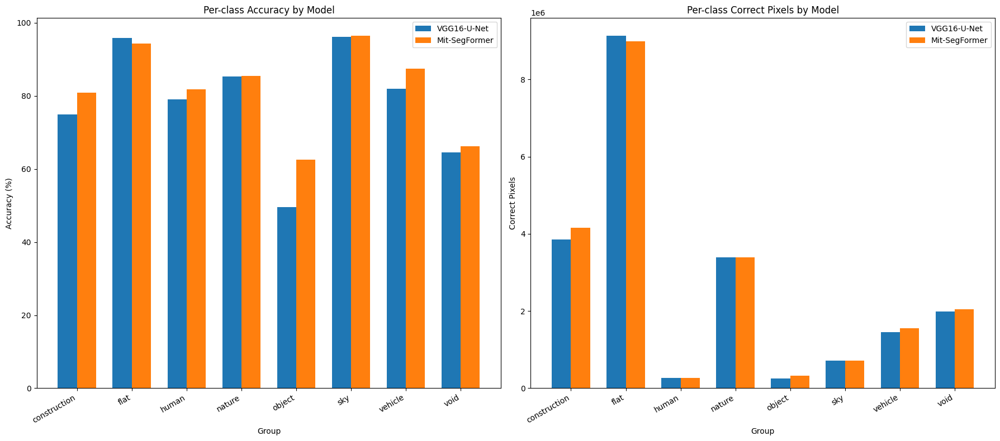

In [ ]:
df_summary_base['Model'] = 'VGG16-U-Net'
df_summary['Model'] = 'Mit-SegFormer'

metric_df = pd.concat([df_summary_base, df_summary])
metric_df.reset_index(drop=True, inplace=True)

plt.figure(figsize=(18, 8))
# Plot Accuracy (%)
ax = plt.subplot(1, 2, 1)
plot_grouped_bars(metric_df, "Accuracy (%)", "Per-class Accuracy by Model", ax)

# Plot Correct Pixels
ax = plt.subplot(1, 2, 2)
plot_grouped_bars(metric_df, "Correct Pixels", "Per-class Correct Pixels by Model", ax)

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

df = pd.DataFrame({
    "Modèle": [
        "VGG16-U-Net",
        "Mit-SegFormer"
    ],
    "Val Loss final": [
        np.min(hist_base_model.history['val_loss']),
        np.min(hist_seg_model.history['val_loss'])
    ],
    "Val Mean IoU (#8 classes)": [
        np.max(hist_base_model.history['val_mean_io_u_argmax']),
        np.max(hist_seg_model.history['val_mean_io_u_argmax'])
    ],
    "Val Accuracy": [
        np.max(hist_base_model.history['val_accuracy']),
        np.max(hist_seg_model.history['val_accuracy'])
    ],
    "Paramètres totaux": [
        base_model.count_params(),
        seg_model.count_params()
    ]
})

display(df)

,Modèle,Val Loss final,Val Mean IoU (#8 classes),Val Accuracy,Paramètres totaux
0,VGG16-U-Net,0.204714,0.629848,0.853893,25341576
1,Mit-SegFormer,0.162811,0.666853,0.874471,29512904


* **Loss** : 0.2047 → **0.1628** avec SegFormer (**−0.042**, ≈ **−20%**).
* **mIoU** : 0.6298 → **0.6669** (**+0.037**, **+3.7 pts**).
* **Accuracy** : 0.8539 → **0.8745** (**+2.06 pts**).
* **Paramètres** : 25.34 M → **29.51 M** (**+4.17 M**, ≈ **+16%**).



## Conclusion


Le **meilleur modèle** est **SegFormer** avec backbone **MiT (Mix Transformer)**.
Son encodeur Transformer hiérarchique (MiT) + **décodeur léger MLP** capture mieux le contexte global et produit des frontières plus nettes, ce qui se traduit par **une mIoU et une accuracy supérieures** pour un surcoût paramétrique modéré (\~16%).

# Optimisation des hyperparametes

In [ ]:
!pip install optuna optuna-integration -q
import optuna
from optuna.integration import TFKerasPruningCallback

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.9/395.9 kB 25.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.9/98.9 kB 10.4 MB/s eta 0:00:00


In [ ]:
CLASS_COUNTS = class_counts
EPS = 1e-8

def weights_from_trial(trial, counts=CLASS_COUNTS):
    clip_low  = trial.suggest_float("w_clip_low", 0.2, 1.0)
    clip_high = trial.suggest_float("w_clip_high", 1.0, 5.0)
    if clip_low > clip_high:
        clip_low, clip_high = clip_high, clip_low

    beta = trial.suggest_float("w_beta", 0.90, 0.99999, log=True)
    eff_num = (1. - np.power(beta, counts + EPS)) / (1. - beta)
    w = 1. / (eff_num + EPS)

    # normaliser pour garder une moyenne = 1 (stabilise l’échelle de la loss)
    w = w * (len(w) / (w.sum() + EPS))
    # clamping pour éviter des extrêmes
    w = np.clip(w, clip_low, clip_high).astype(np.float32)
    return w

def make_weighted_datasets(base_train, base_val, w_vec):
    w_tf = tf.constant(w_vec, dtype=tf.float32)
    @tf.autograph.experimental.do_not_convert
    def add_pixel_weights(x, y):
        y_ids = tf.squeeze(y, axis=-1) if y.shape.rank == 4 else y
        y_ids = tf.cast(y_ids, tf.int32)
        wmap  = tf.gather(w_tf, y_ids)  # (B,H,W)
        if IGNORE_INDEX is not None:
            wmap = tf.where(tf.equal(y_ids, IGNORE_INDEX), 0.0, wmap)
        return x, y, wmap

    train = base_train.map(add_pixel_weights, num_parallel_calls=tf.data.AUTOTUNE).prefetch(tf.data.AUTOTUNE)
    val   = base_val.map(add_pixel_weights,   num_parallel_calls=tf.data.AUTOTUNE).prefetch(tf.data.AUTOTUNE)
    return train, val

In [ ]:
%%time
base_train, base_val = make_dataset(data_type="train", batch_size=32, validation_split=0.2, augment=True)

train_sample_2 = base_train.take(int(0.4*len(base_train)))
validation_sample_2 = base_val.take(int(0.8*len(base_val)))

CPU times: user 155 ms, sys: 138 ms, total: 293 ms
Wall time: 623 ms


In [ ]:
def objective(trial):
    tf.keras.backend.clear_session()  # clean pour la mémoire entre essais

    # Hyperparams “classiques”
    learning_rate = trial.suggest_float("learning_rate", 1e-4, 1e-2, log=True)

    # Hyperparams de pondération -> vecteur w
    w_vec = weights_from_trial(trial, counts=CLASS_COUNTS)

    # Datasets pondérés pour CET essai
    train_ds_, val_ds_ = make_weighted_datasets(train_sample_2, validation_sample_2, w_vec)

    model = create_model(model_type='segformer', mit_preset='mit_b2_cityscapes_1024', decoder_dim=256, decoder_depth=2, name="SegFormer_B2x256d2")

    model = compile_model(model, learning_rate=learning_rate, loss_type="cross_entropy")

    pruning_callback = TFKerasPruningCallback(trial, "val_loss")

    history = model.fit(
        train_ds_,
        validation_data=val_ds_,
        epochs=30,
        callbacks=[
            tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True),
            tf.keras.callbacks.ReduceLROnPlateau(patience=5),
            pruning_callback
        ],
        verbose=0
    )

    return np.max(history.history["val_mean_io_u_argmax"])

In [ ]:
%%time
study = optuna.create_study(study_name="mit_segform_hyperparameter_optimization", direction="maximize")
study.optimize(objective, n_trials=10)

[I 2025-08-16 17:21:54,856] A new study created in memory with name: mit_segform_hyperparameter_optimization
[I 2025-08-16 17:30:51,020] Trial 0 finished with value: 0.6859431266784668 and parameters: {'learning_rate': 0.0013084173051306595, 'w_clip_low': 0.9522366808219431, 'w_clip_high': 4.77172724168245, 'w_beta': 0.9828616621254209}. Best is trial 0 with value: 0.6859431266784668.
[I 2025-08-16 17:40:07,008] Trial 1 finished with value: 0.6732193827629089 and parameters: {'learning_rate': 0.0046932758823817955, 'w_clip_low': 0.45961329186671174, 'w_clip_high': 1.0976822388265162, 'w_beta': 0.9278371973831665}. Best is trial 0 with value: 0.6859431266784668.
[I 2025-08-16 17:48:11,217] Trial 2 finished with value: 0.680526614189148 and parameters: {'learning_rate': 0.0004997773988690923, 'w_clip_low': 0.9721658431437907, 'w_clip_high': 3.3596859106868706, 'w_beta': 0.9548711688307523}. Best is trial 0 with value: 0.6859431266784668.
[I 2025-08-16 17:57:14,368] Trial 3 finished with 

CPU times: user 8h 11min 1s, sys: 9min 7s, total: 8h 20min 9s
Wall time: 1h 10min 20s


In [ ]:
print("Best hyperparameters:")
print(study.best_params)

print("Best validation mean Iou:", study.best_value)

Best hyperparameters:
{'learning_rate': 0.0002445325578418483, 'w_clip_low': 0.2004605047459406, 'w_clip_high': 1.5629622631149576, 'w_beta': 0.9990475269434124}
Best validation mean Iou: 0.6874387860298157


In [ ]:
np.save(f"{base_path}study.npy", study)

In [ ]:
optuna.visualization.plot_slice(study,target_name="Mean Iou")

In [ ]:
optuna.visualization.plot_rank(study)

Entrainement du modéle final

In [ ]:
study.best_params

{'learning_rate': 0.0002445325578418483,
 'w_clip_low': 0.2004605047459406,
 'w_clip_high': 1.5629622631149576,
 'w_beta': 0.9990475269434124}

In [ ]:
eff_num

array([1049.89846493, 1049.89846493, 1049.89846493, 1049.89846493,
       1049.89846493, 1049.89846493, 1049.89846493, 1049.89846493])

In [ ]:
beta = study.best_params["w_beta"]
clip_low  = study.best_params["w_clip_low"]
clip_high = study.best_params["w_clip_high"]

eff_num = (1. - np.power(beta, counts + EPS)) / (1. - beta)
w = 1. / (eff_num + EPS)
w = w * (len(w) / (w.sum() + EPS))
w = np.clip(w, clip_low, clip_high).astype(np.float32)
print(w)
train_ds_final, val_ds_final = make_weighted_datasets(base_train, base_val, w)

final_model = create_model(
    model_type='segformer',
    mit_preset='mit_b2_cityscapes_1024',
    decoder_dim=256,
    decoder_depth=2,
    name="SegFormer_B2x256d2"
)
final_model = compile_model(
    final_model,
    learning_rate=study.best_params["learning_rate"],
    loss_type="cross_entropy",
    metrics=['accuracy', MeanIoUArgmax(num_classes=8)]
)
final_model.summary()

[0.9999987 0.9999987 0.9999987 0.9999987 0.9999987 0.9999987 0.9999987
 0.9999987]


Model: "SegFormer_B2x256d2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resize_to_mit       │ (None, 224, 224,  │          0 │ input_layer_5[0]… │
│ (Resizing)          │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mit_pyramid_extrac… │ [(None, 56, 56,   │ 24,196,288 │ resize_to_mit[0]… │
│ (Functional)        │ 64), (None, 28,   │            │                   │
│                     │ 28, 128), (None,  │            │                   │
│                     │ 14, 14, 320),     │            │                   │
│                     │ (None, 7, 7,      │            │                   │
│                     │ 512)]             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_64 (Conv2D)  │ (None, 28, 28,    │    294,912 │ mit_pyramid_extr… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_65 (Conv2D)  │ (None, 14, 14,    │    737,280 │ mit_pyramid_extr… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_66 (Conv2D)  │ (None, 7, 7, 256) │  1,179,648 │ mit_pyramid_extr… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_63 (Conv2D)  │ (None, 56, 56,    │    147,456 │ mit_pyramid_extr… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 28, 28,    │      1,024 │ conv2d_64[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 14, 14,    │      1,024 │ conv2d_65[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 7, 7, 256) │      1,024 │ conv2d_66[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │      1,024 │ conv2d_63[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_13       │ (None, 28, 28,    │          0 │ batch_normalizat… │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_14       │ (None, 14, 14,    │          0 │ batch_normalizat… │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_15       │ (None, 7, 7, 256) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_12       │ (None, 56, 56,    │          0 │ batch_normalizat… │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_6     │ (None, 56, 56,    │          0 │ activation_13[0]

 Total params: 29,512,904 (112.58 MB)

 Trainable params: 5,313,544 (20.27 MB)

 Non-trainable params: 24,199,360 (92.31 MB)

In [ ]:
%%time
history = final_model.fit(
    train_ds_final,
    validation_data=val_ds_final,
    epochs=30,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
        tf.keras.callbacks.ReduceLROnPlateau(patience=3),
    ]
)

Epoch 1/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 212s 2s/step - accuracy: 0.7708 - loss: 0.6971 - mean_io_u_argmax: 0.4751 - val_accuracy: 0.8649 - val_loss: 0.4335 - val_mean_io_u_argmax: 0.5959 - learning_rate: 2.4453e-04
Epoch 2/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 39s 519ms/step - accuracy: 0.8554 - loss: 0.4207 - mean_io_u_argmax: 0.6045 - val_accuracy: 0.8736 - val_loss: 0.3673 - val_mean_io_u_argmax: 0.6201 - learning_rate: 2.4453e-04
Epoch 3/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 37s 495ms/step - accuracy: 0.8662 - loss: 0.3811 - mean_io_u_argmax: 0.6285 - val_accuracy: 0.8771 - val_loss: 0.3534 - val_mean_io_u_argmax: 0.6307 - learning_rate: 2.4453e-04
Epoch 4/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 39s 510ms/step - accuracy: 0.8726 - loss: 0.3597 - mean_io_u_argmax: 0.6418 - val_accuracy: 0.8835 - val_loss: 0.3366 - val_mean_io_u_argmax: 0.6447 - learning_rate: 2.4453e-04
Epoch 5/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 39s 511ms/step - accuracy: 0.8775 - loss: 0.3442 - mean_io_u_argmax: 0.6528 - val_accuracy: 0.8867 - val

Visualisation des performances

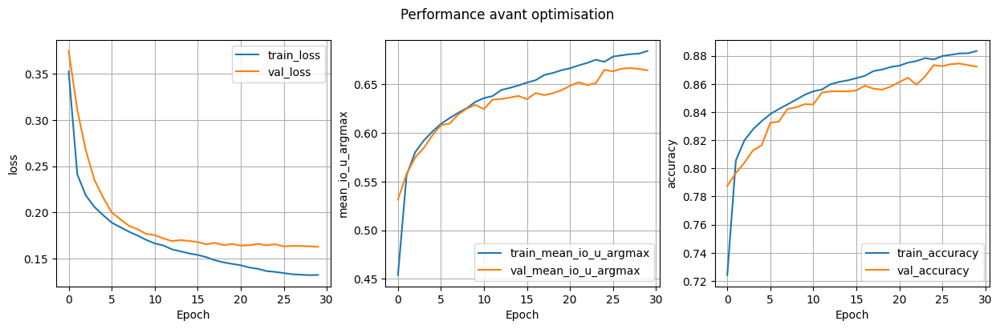

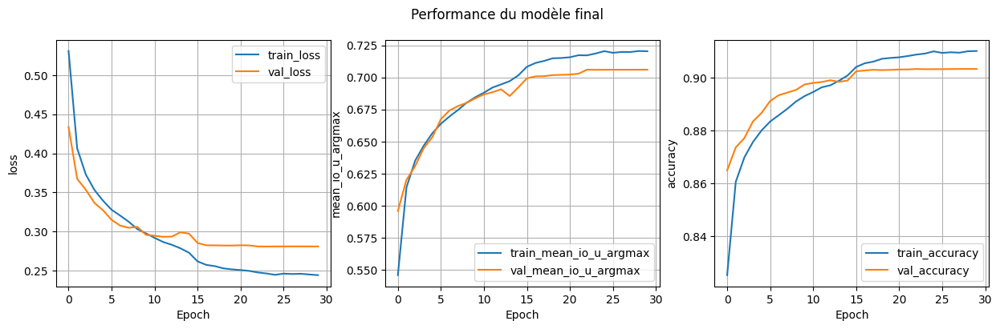

In [ ]:
plot_training_history(history=hist_seg_model, metrics_to_plot=['loss', 'mean_io_u_argmax', 'accuracy'], ncols=3, title="Performance avant optimisation")
plot_training_history(history=history, metrics_to_plot=['loss', 'mean_io_u_argmax', 'accuracy'], ncols=3, title="Performance du modèle final")

Tests de prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step


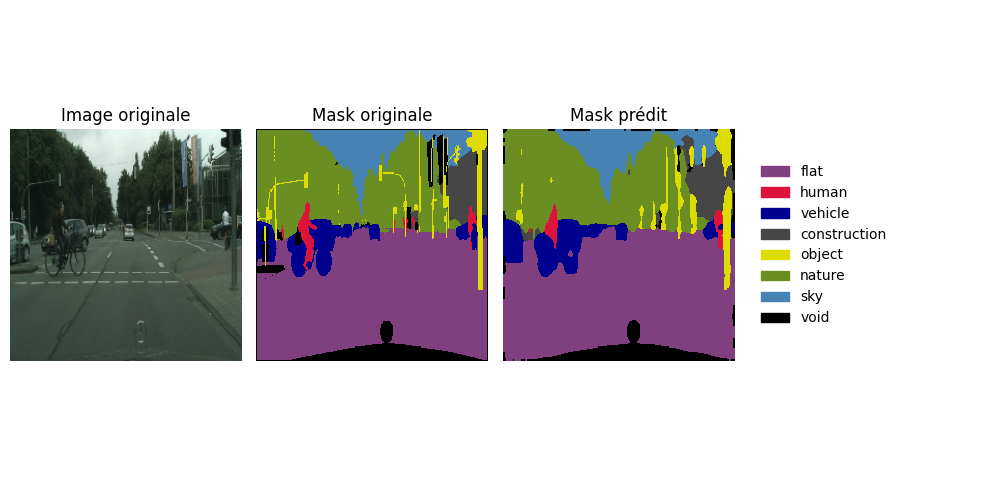

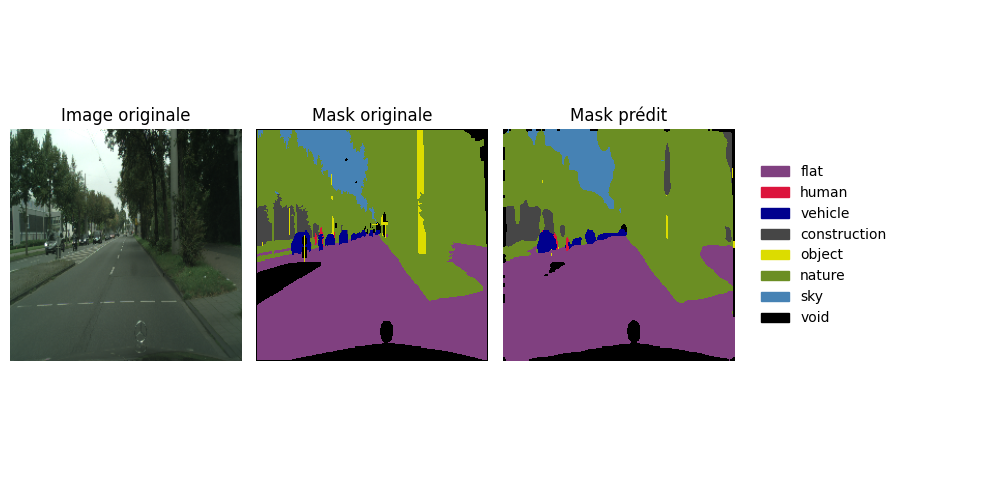

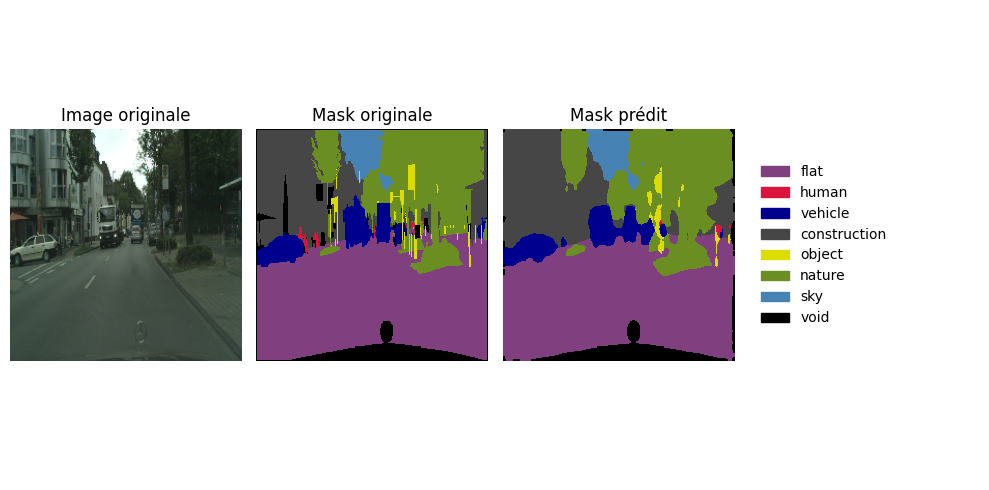

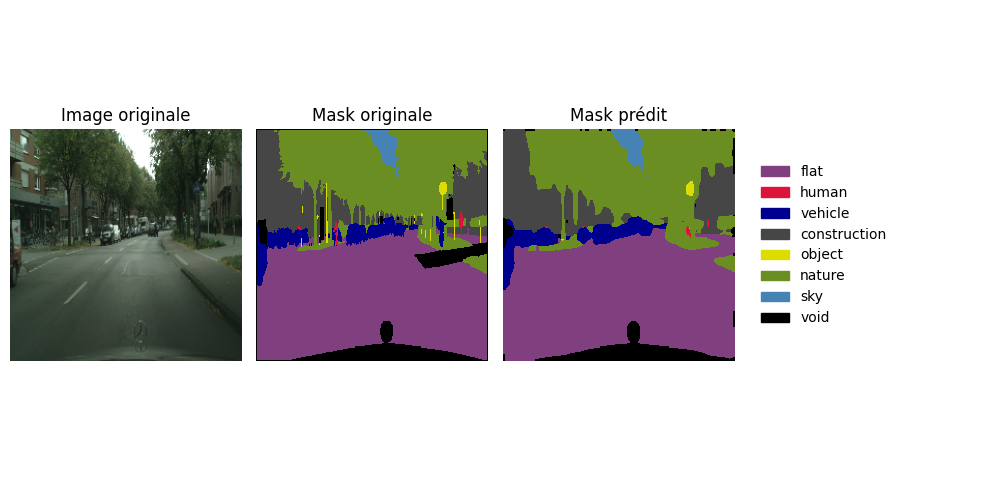

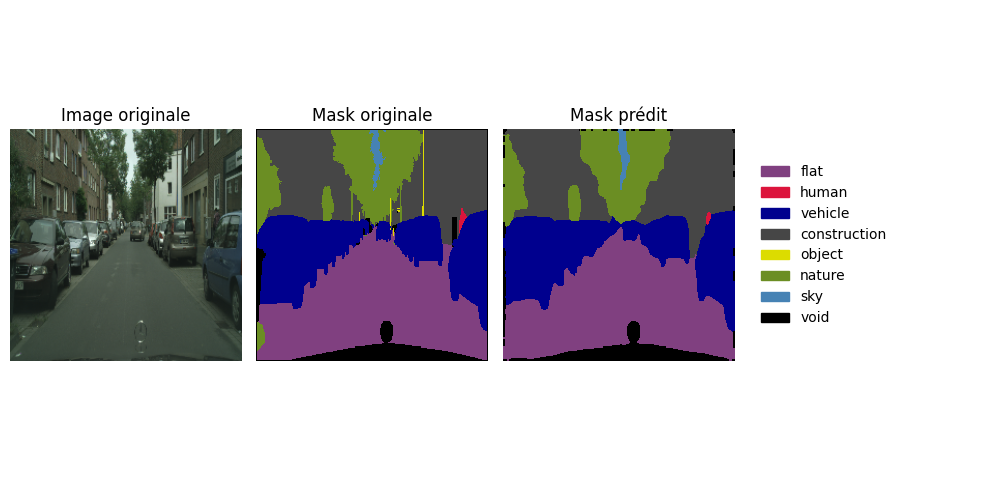

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


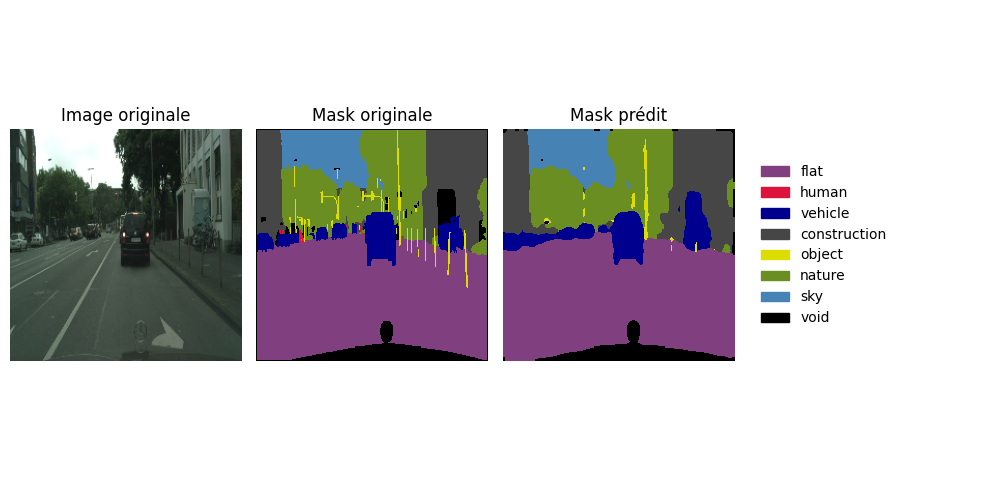

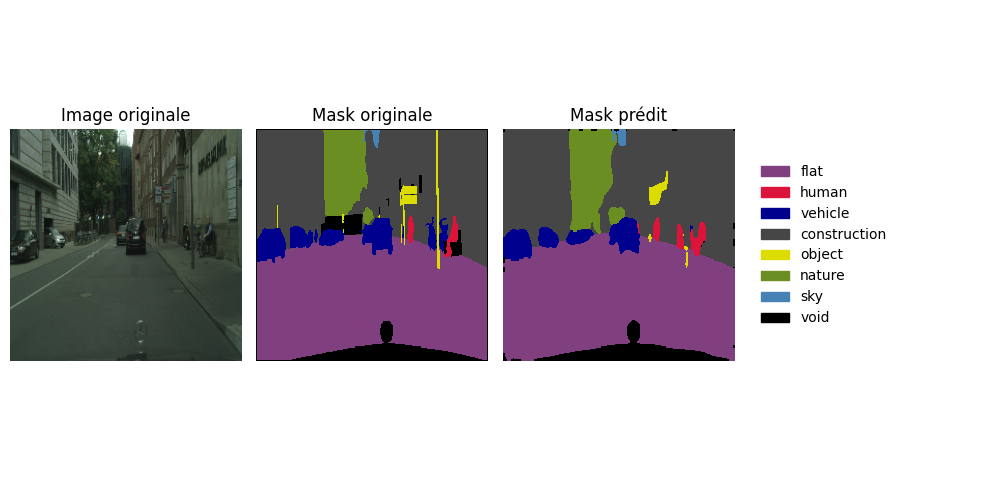

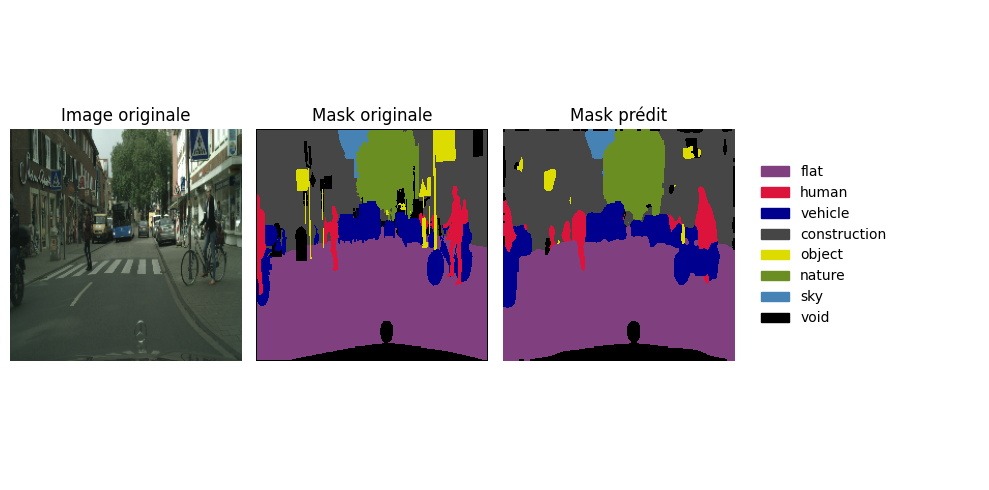

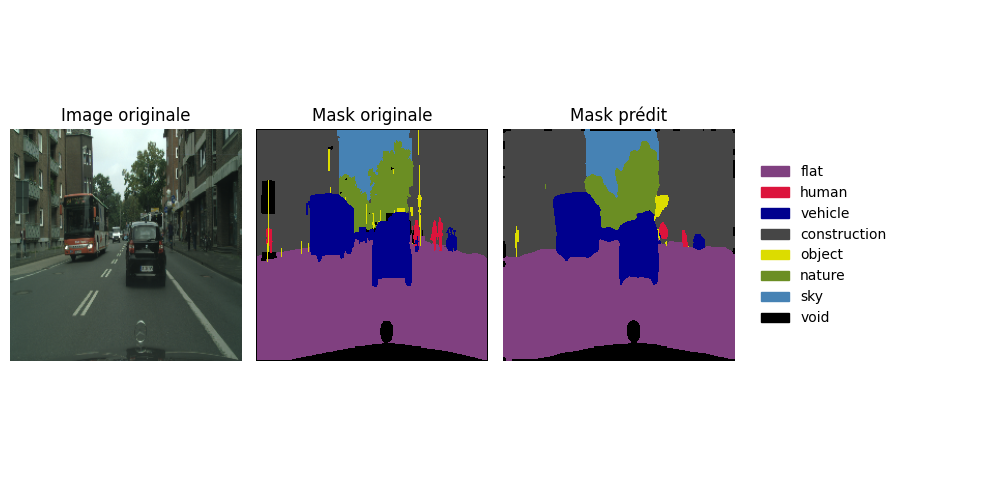

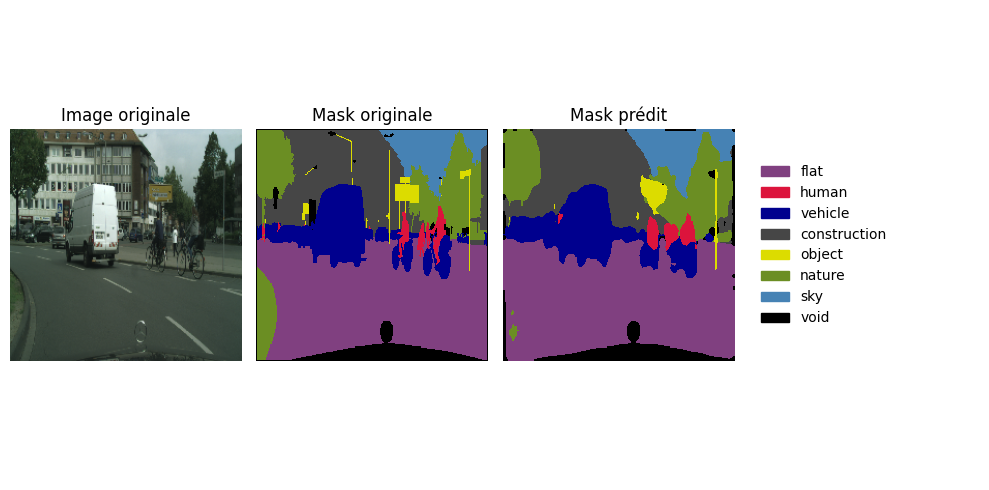

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


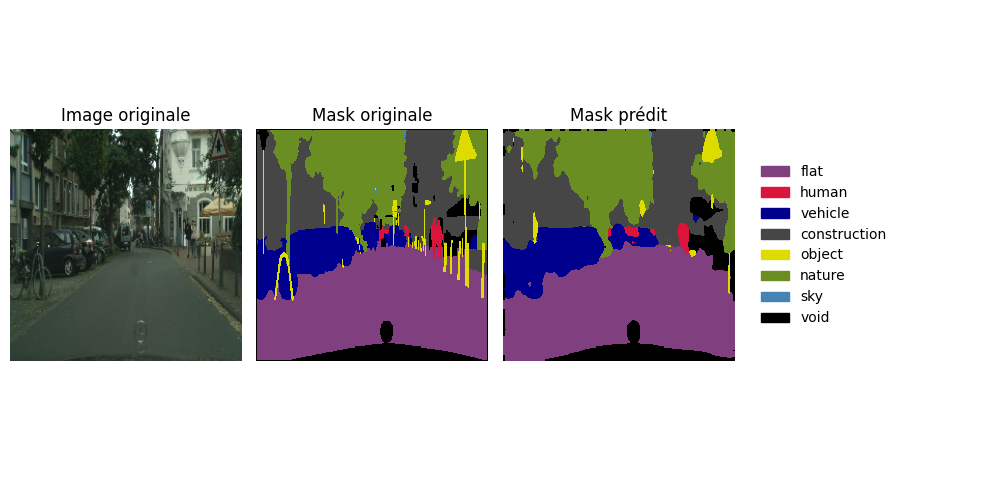

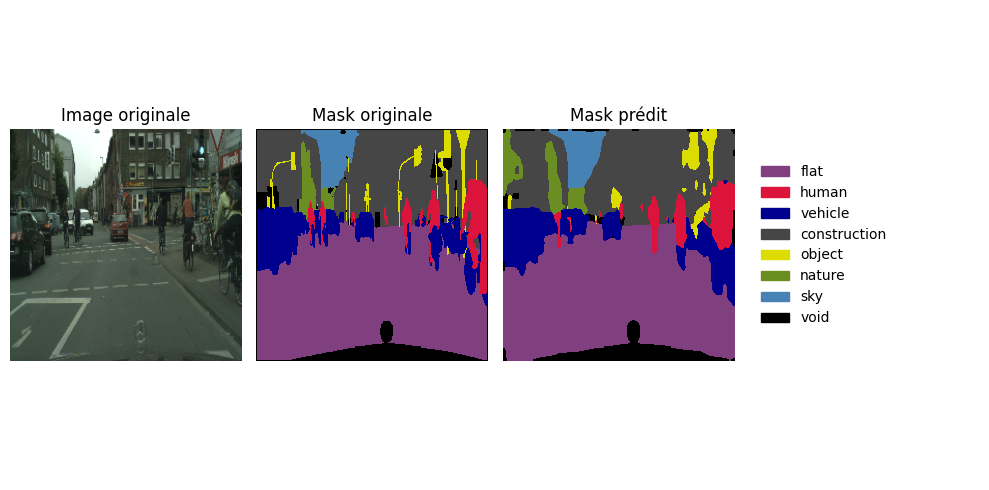

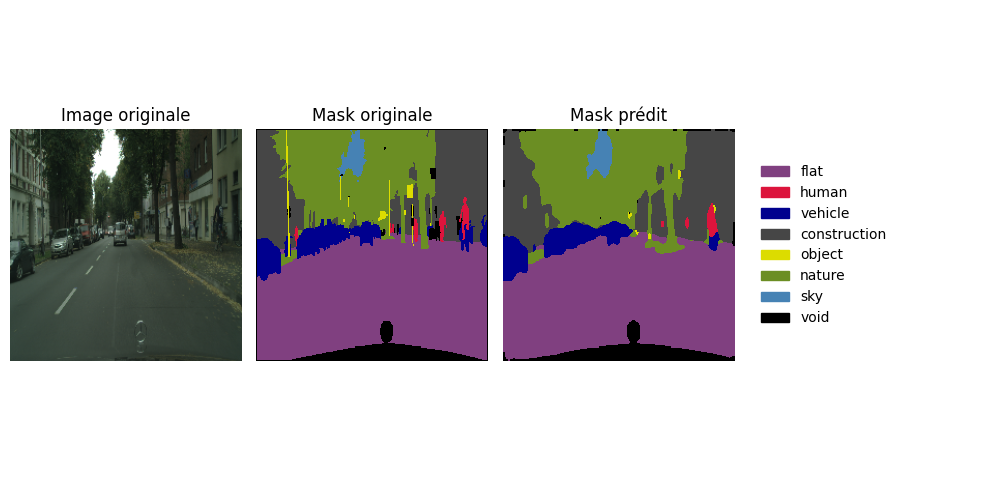

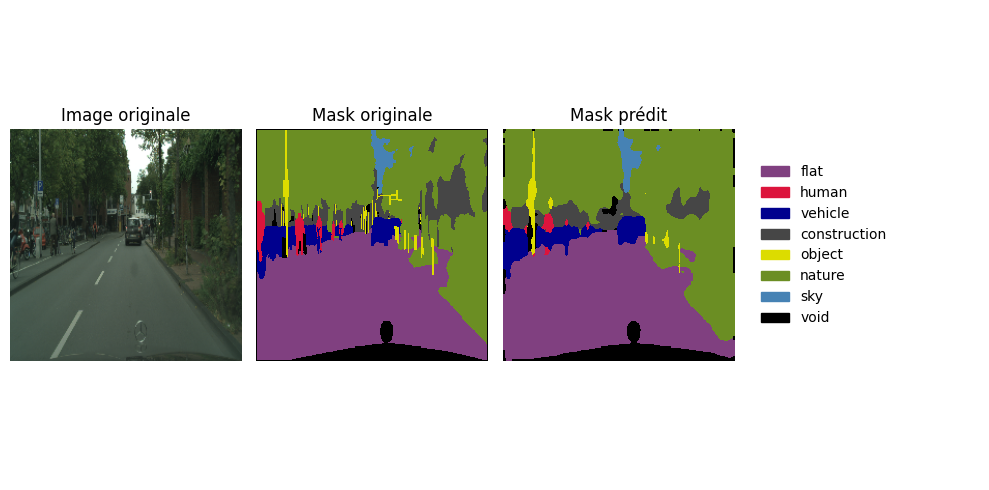

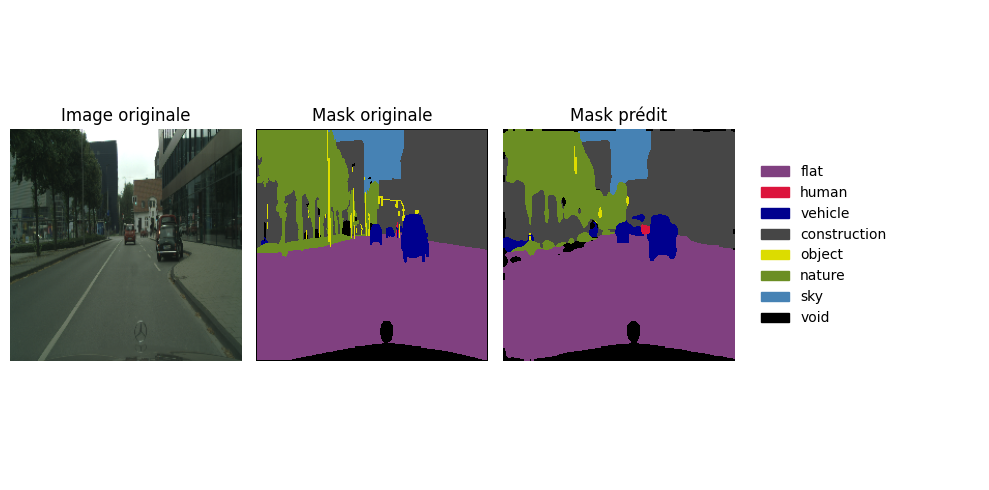

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


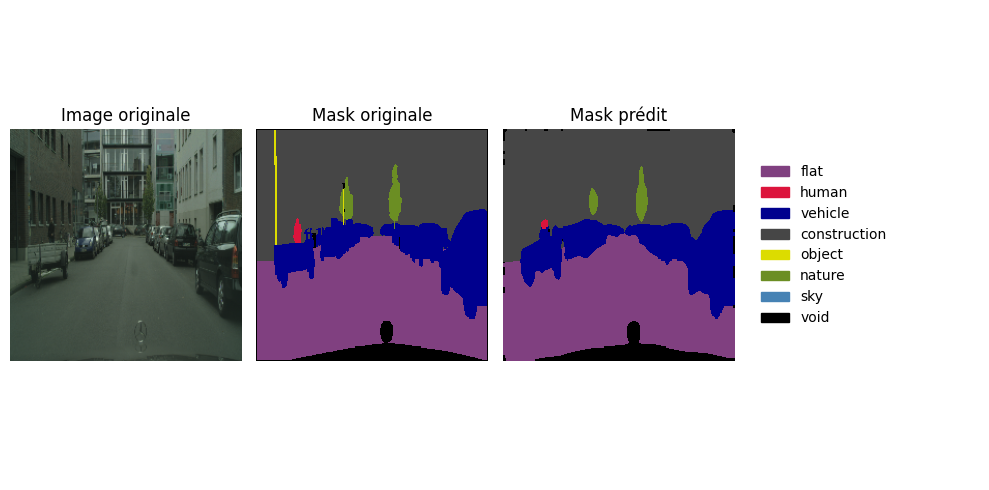

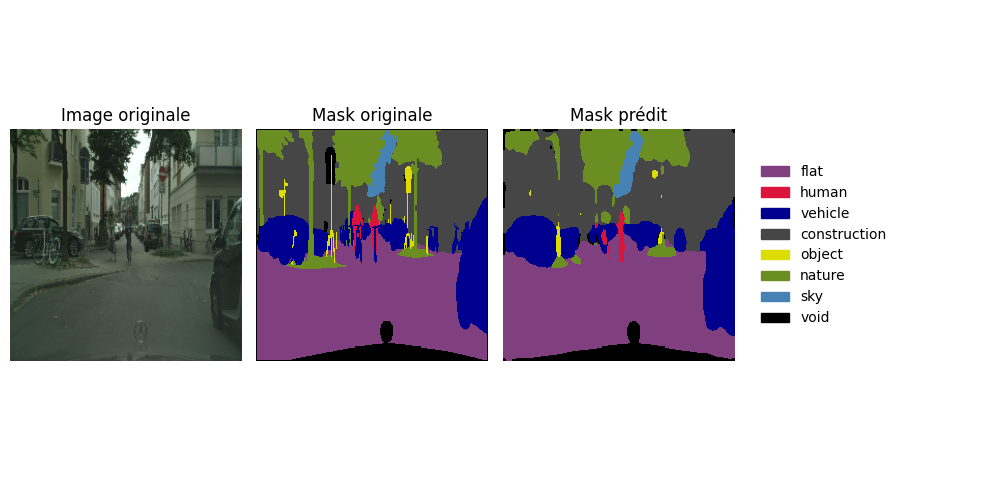

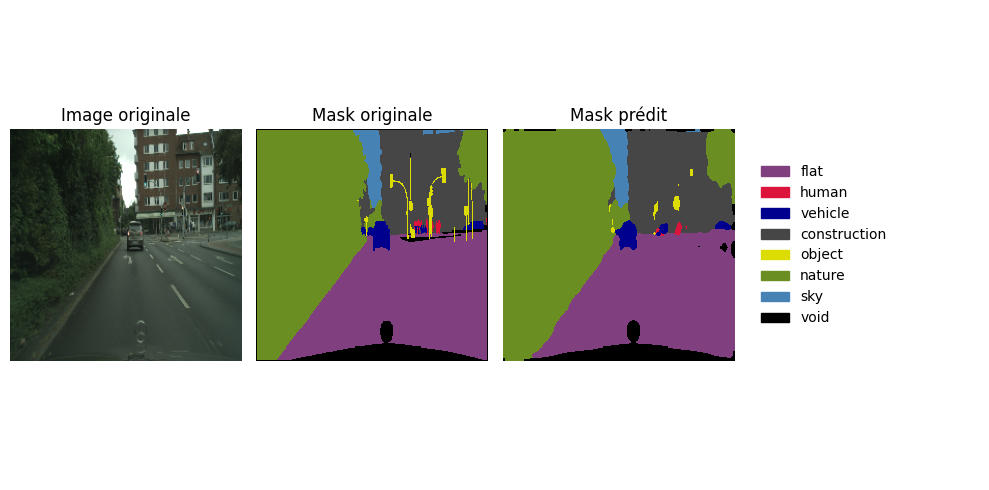

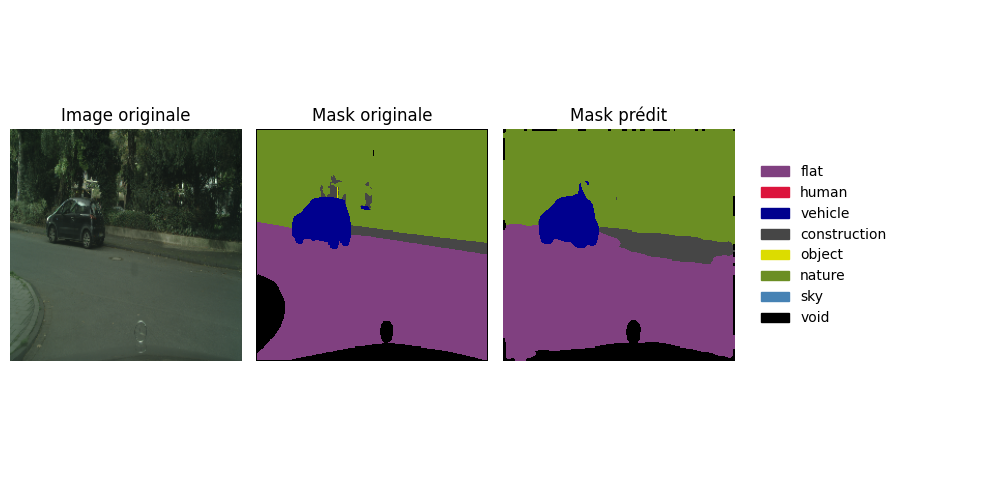

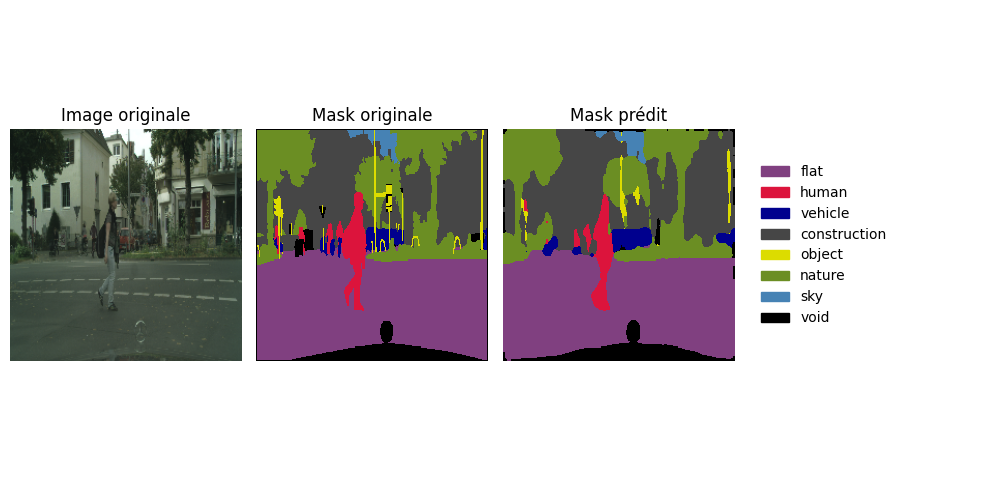

In [ ]:
for batch, masks in test_ds.take(4):
    preds = final_model.predict(batch)
    pred_masks = np.argmax(preds, axis=-1)
    batch_np = batch.numpy()
    masks_np = masks.numpy()

    for i in range(5):
        display_prediction(batch_np[i], masks_np[i], pred_masks[i])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step
y_true shape: (25088000,) y_pred shape: (25088000,)


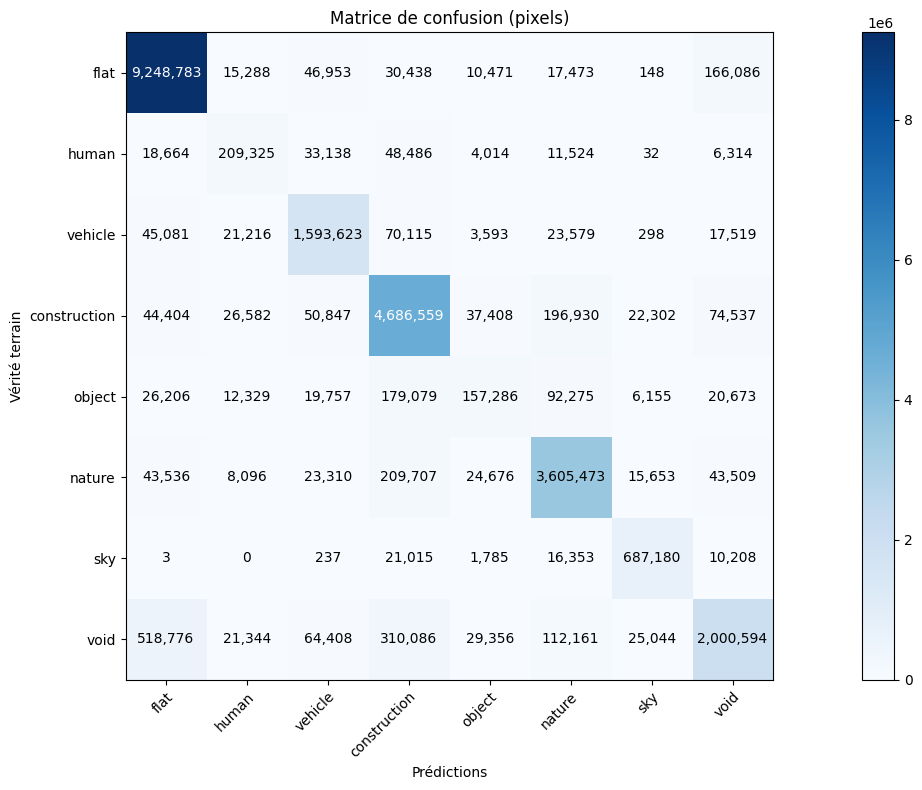

In [ ]:
df_summary_fm = plot_confusion_matrix(final_model, test_ds)

In [ ]:
df_summary_fm.sort_values(by="Accuracy (%)", ascending=False, inplace=True)
df_summary_fm.reset_index(drop=True, inplace=True)
display(df_summary_fm)

,Group,Total Pixels,Correct Pixels,Accuracy (%)
0,flat,9535640,9248783,96.991738
1,sky,736781,687180,93.267877
2,construction,5139569,4686559,91.185837
3,nature,3973960,3605473,90.727461
4,vehicle,1775024,1593623,89.780364
5,void,3081769,2000594,64.917065
6,human,331497,209325,63.145368
7,object,513760,157286,30.614684


In [ ]:
# MLFLOW
!pip install mlflow==2.22.0 -q
import mlflow
import mlflow.sklearn
from mlflow.models import infer_signature

In [ ]:
%%time
import importlib.metadata as md
MLFLOW_TRACKING_URI = "https://mlflow.amadousy.dev"
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)
mlflow.set_experiment("mit_segformer_model")

for x_batch, _ in test_ds.take(1):
    x_example = x_batch.numpy()
    break

def pin(pkg):
    try: return f"{pkg}=={md.version(pkg)}"
    except: return pkg

reqs = [
    pin("tensorflow"),
    pin("keras"),
    pin("keras-hub"),
]
with mlflow.start_run():
    mlflow.log_param("learning_rate", study.best_params["learning_rate"])
    mlflow.log_param("loss_type", "cross_entropy")
    mlflow.log_param("optimizer", "Adam")
    mlflow.log_param("epochs", 30)
    mlflow.log_param("batch_size", 32)
    mlflow.log_param("augmentation", True)
    mlflow.log_param("validation_split", 0.2)
    mlflow.log_param("w_beta", study.best_params["w_beta"])
    mlflow.log_param("w_clip_low", study.best_params["w_clip_low"])
    mlflow.log_param("w_clip_high", study.best_params["w_clip_high"])
    mlflow.log_param("mit_preset", "mit_b2_cityscapes_1024")
    mlflow.log_param("decoder_dim", 256)
    mlflow.log_param("decoder_depth", 2)
    mlflow.log_param("model_type", "segformer")


    mlflow.log_metric("val_accuracy", np.max(history.history["val_accuracy"]))
    mlflow.log_metric("val_loss", np.min(history.history["val_loss"]))
    mlflow.log_metric("mean_io_u_argmax", np.max(history.history["val_mean_io_u_argmax"]))

    mit_segformer_model_path = "mit_segformer_model.keras"
    final_model.save(mit_segformer_model_path)
    import os
    print(f"Size model: {os.path.getsize('mit_segformer_model.keras') / (1024**2)}")  # MB
    mlflow.log_artifact(mit_segformer_model_path, artifact_path="artifacts")

    signature = infer_signature(x_example, final_model.predict(x_example))

    mlflow.tensorflow.log_model(
        model=final_model,
        signature=signature,
        artifact_path="model",
        registered_model_name="mit_segformer_model",
        pip_requirements=reqs
    )

Size model: 153.93792915344238
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


Registered model 'mit_segformer_model' already exists. Creating a new version of this model...
2025/08/16 19:19:32 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: mit_segformer_model, version 13
Created version '13' of model 'mit_segformer_model'.


🏃 View run gentle-hawk-280 at: https://mlflow.amadousy.dev/#/experiments/23/runs/39eeb61f55ab4f0c927405c1f253f796
🧪 View experiment at: https://mlflow.amadousy.dev/#/experiments/23
CPU times: user 8.51 s, sys: 971 ms, total: 9.48 s
Wall time: 52.2 s


Tests sur des données sans masks

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


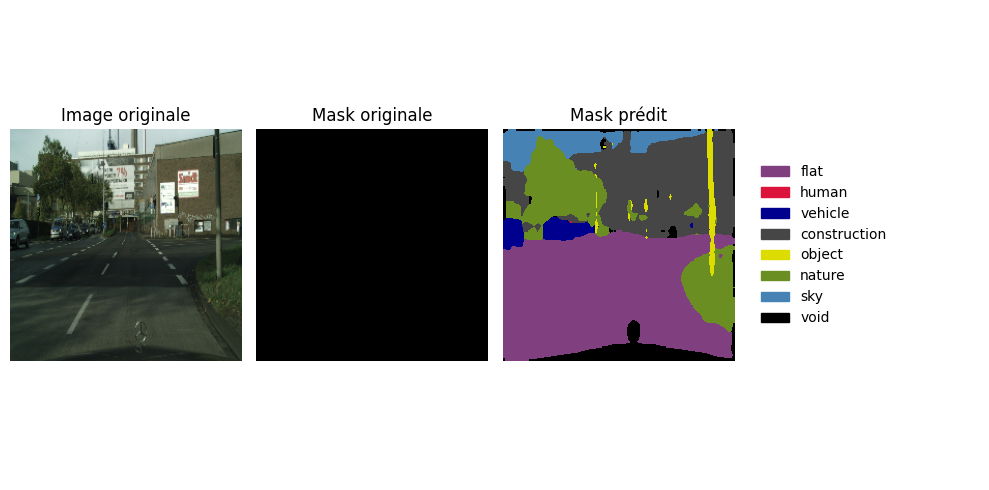

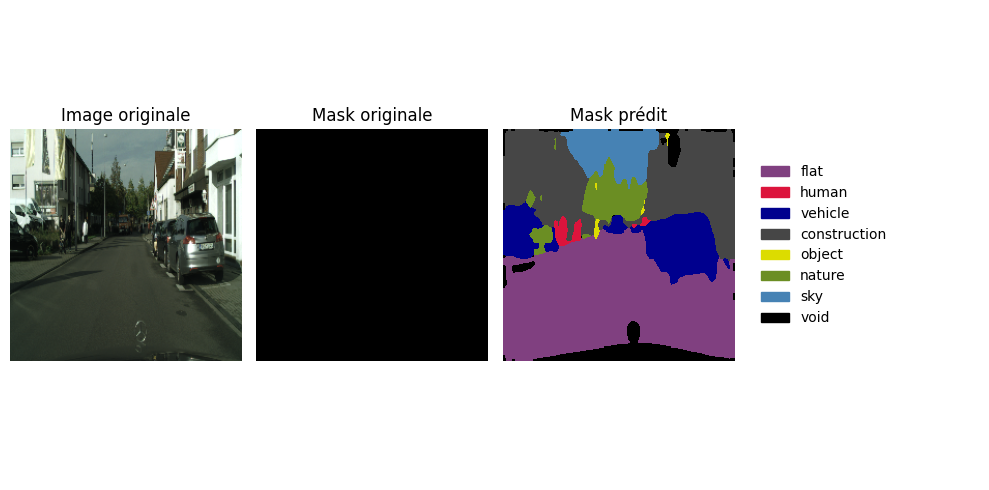

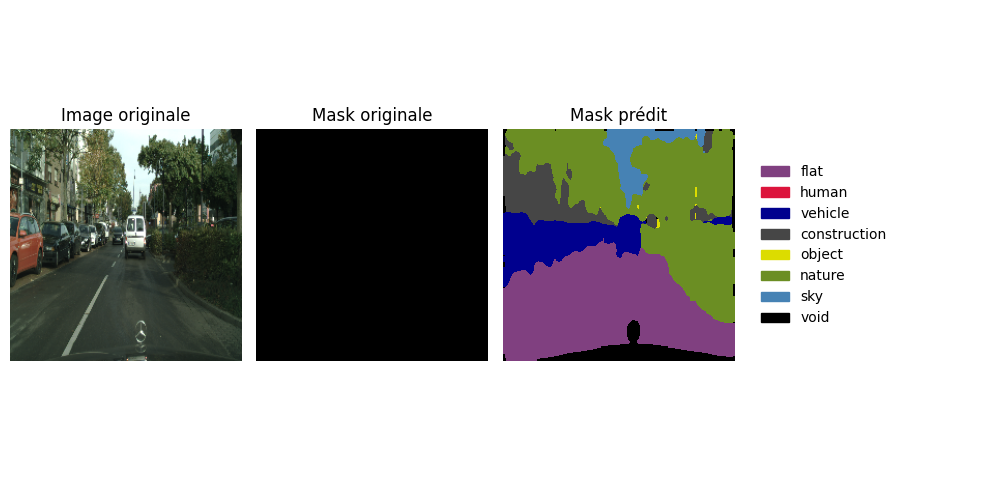

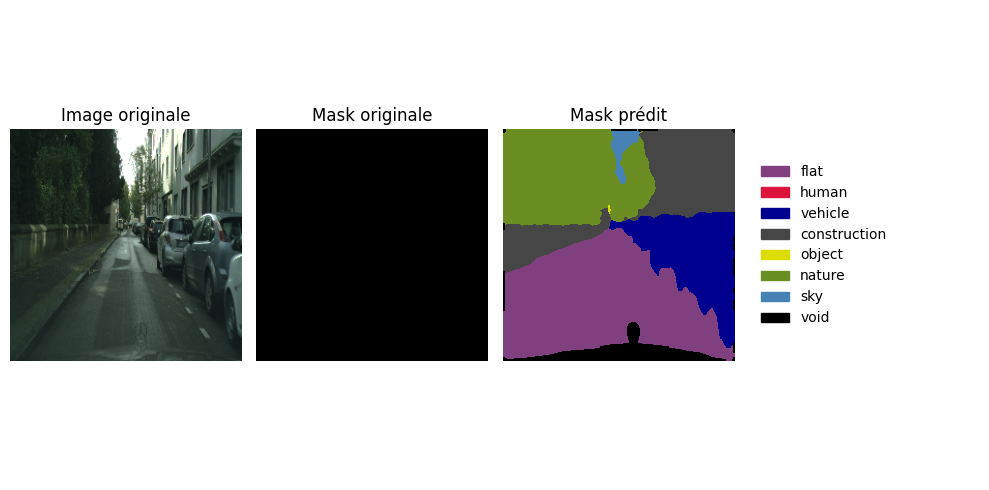

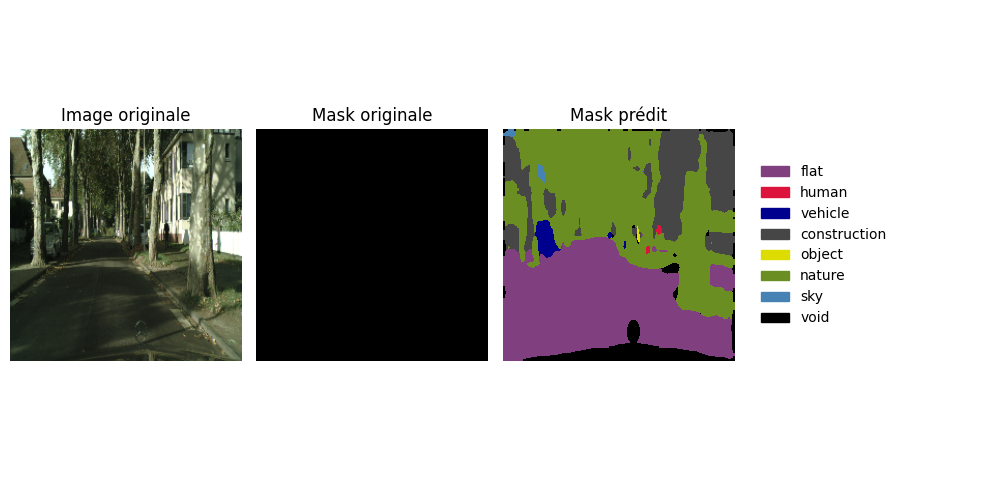

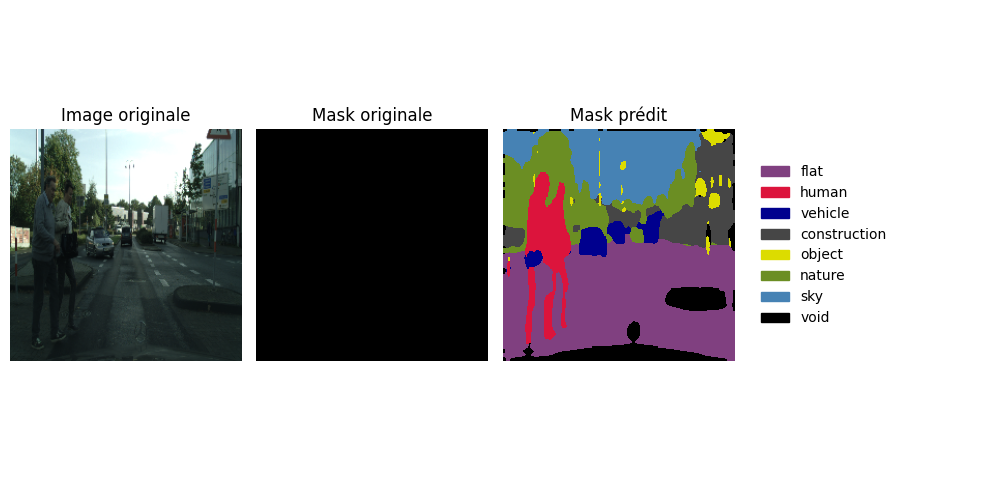

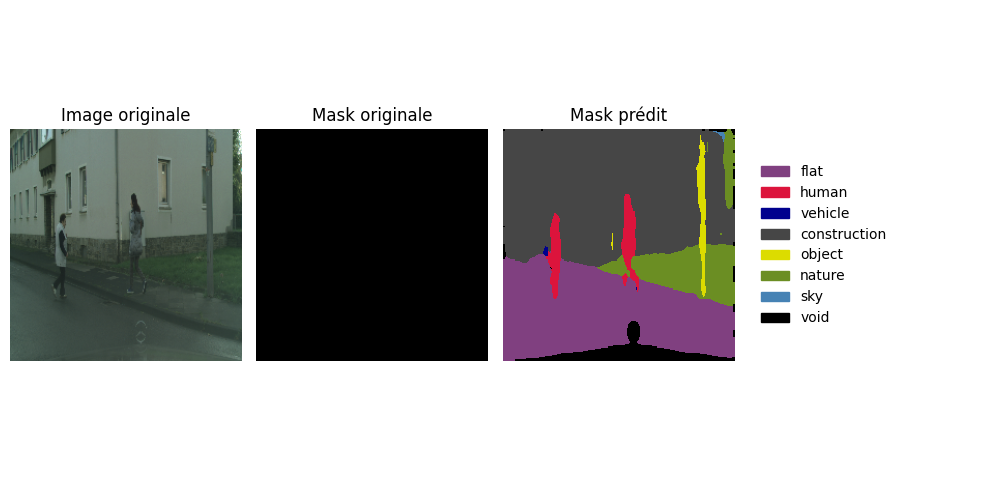

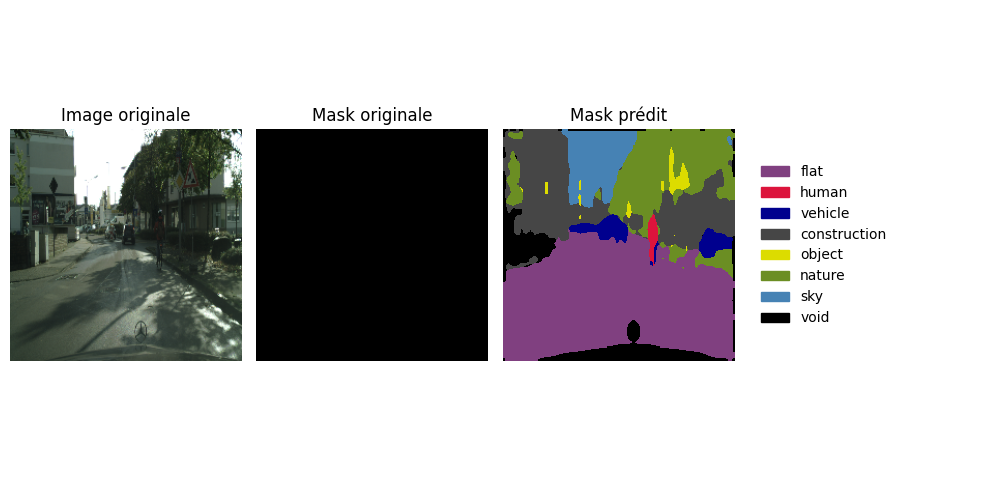

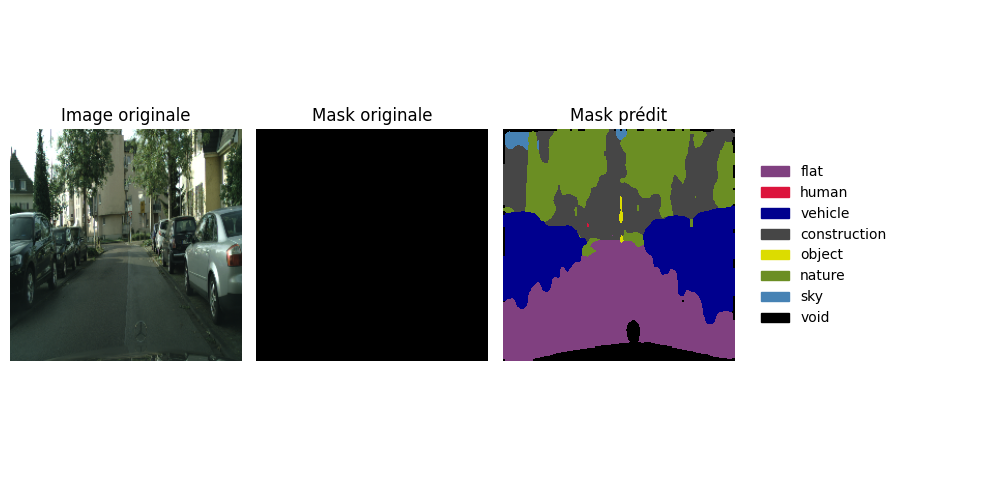

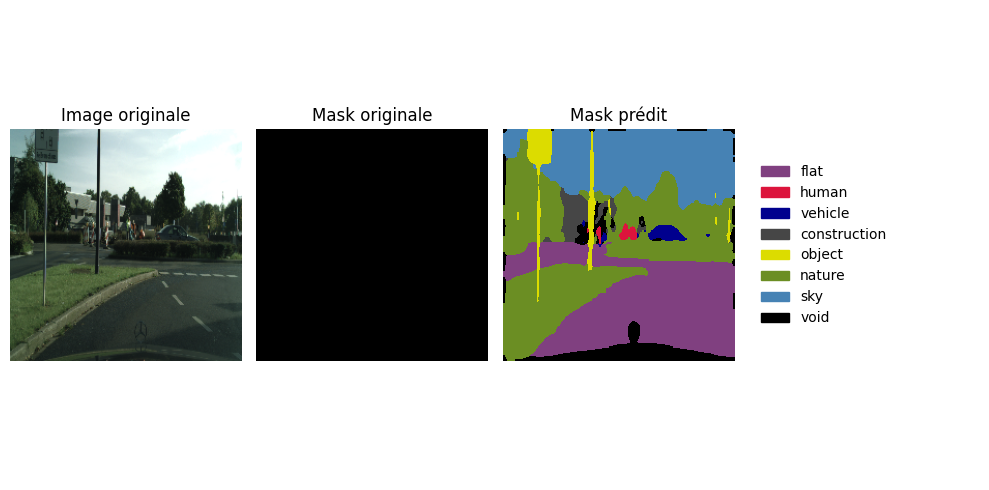

In [ ]:
for batch, masks in test_wo_mask_ds.take(1):
    preds = final_model.predict(batch)
    pred_masks = np.argmax(preds, axis=-1)
    batch_np = batch.numpy()
    masks_np = masks.numpy()

    for i in range(10):
        display_prediction(batch_np[i], masks_np[i], pred_masks[i])

In [ ]:
end_time = time.time()
print(f"Execution time={end_time-init_time} seconds")

Execution time=23088.32980656624 seconds
